In [1]:
import sklearn
import tensorflow as tf
from tensorflow import keras

import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

## Representation Learning and Generative Learning Using Autoencoders and GANs
- **Autoencoders are artificial neural networks capable of learning dense representations of the input data, called latent representations or codings, without any supervision (i.e., the training set is unlabeled)**.
- **These codings typically have a much lower dimensionality than the input data, making autoencoders useful for dimensionality reduction**, especially for visualization purposes.
- **Autoencoders also act as feature detectors, and they can be used for unsupervised pretraining of deep neural networks.**
- Lastly, **some autoencoders are generative models: they are capable of randomly generating new data that looks very similar to the training data.**
    - For example, you could train an autoencoder on pictures of faces, and it would then be able to generate new faces. However, the generated images are usually fuzzy and not entirely realistic.
- In contrast, faces generated by **generative adversarial networks (GANs)** are now so convincing that it is hard to believe that the people they represent do not exist.
    - You can judge so for yourself by visiting https://thispersondoesnotexist.com/, a website that shows faces generated by a recent GAN architecture called **StyleGAN.**
- GANs are now widely used for super resolution (increasing the resolution of an image), colorization, powerful image editing (e.g., replacing photo bombers with realistic background), turning a simple sketch into a photorealistic image, predicting the next frames in a video, augmenting a dataset (to train other models), generating other types of data (such as text, audio, and time series), identifying the weaknesses in other models and strengthening them, and more.
- **Autoencoders and GANs are both unsupervised**, they both learn dense representations, they can both be used as generative models, and they have many similar applications. However, they work very differently:
    - **Autoencoders simply learn to copy their inputs to their outputs.** This may sound like a trivial task, but we will see that constraining the network in various ways can make it rather difficult.
        - For example, you can limit the size of the latent representations, or you can add noise to the inputs and train the network to recover the original inputs.
        - **These constraints prevent the autoencoder from trivially copying the inputs directly to the outputs, which forces it to learn efficient ways of representing the data.**
        - In short, **the codings are byproducts of the autoencoder learning the identity function under some constraints.**
    - **GANs are composed of two neural networks:** **a generator** that tries to generate data that looks similar to the training data, and **a discriminator** that tries to tell real data from fake data.
        - This architecture is very original in Deep Learning in that the generator and the discriminator compete against each other during training:
            - **the generator is often compared to a criminal trying to make realistic counterfeit money, while the discriminator is like the police investigator trying to tell real money from fake.**
        - **Adversarial training** (training competing neural networks) is widely considered as one of the most important ideas in recent years.
            - In 2016, Yann LeCun even said that it was “the most interesting idea in the last 10 years in Machine Learning.”

- In this chapter we will start by exploring in more depth how autoencoders work and how to use them for dimensionality reduction, feature extraction, unsupervised pretraining, or as generative models. 
- This will naturally lead us to GANs. 
    - We will start by building a simple GAN to generate fake images, but we will see that training is often quite difficult. 
    - We will discuss the main difficulties you will encounter with adversarial training, as well as some of the main techniques to work around these difficulties. 
    
**Let’s start with autoencoders!**

## Efficient Data Representations
Which of the following number sequences do you find the easiest to memorize?
> 40, 27, 25, 36, 81, 57, 10, 73, 19, 68 <br>
> 50, 48, 46, 44, 42, 40, 38, 36, 34, 32, 30, 28, 26, 24, 22, 20, 18, 16, 14
- At first glance, it would seem that the first sequence should be easier, since it is much shorter. However, if you look carefully at the second sequence, you will notice that it is just the list of even numbers from 50 down to 14.
    - Once you notice this pattern, the second sequence becomes much easier to memorize than the first because you only need to remember the pattern (i.e., decreasing even numbers) and the starting and ending numbers (i.e., 50 and 14).
- Note that if you could quickly and easily memorize very long sequences, you would not care much about the existence of a pattern in the second sequence. You would just learn every number by heart, and that would be that.
    - **The fact that it is hard to memorize long sequences is what makes it useful to recognize patterns**, and hopefully this clarifies why constraining an autoencoder during training pushes it to discover and exploit patterns in the data.
- The relationship between memory, perception, and pattern matching was famously studied by William Chase and Herbert Simon in the early 1970s.
- They observed that expert chess players were able to memorize the positions of all the pieces in a game by looking at the board for just five seconds, a task that most people would find impossible. 
    - However, this was only the case when the pieces were placed in realistic positions (from actual games), not when the pieces were placed randomly.
    - Chess experts don’t have a much better memory than you and I; they just see chess patterns more easily, thanks to their experience with the game. Noticing patterns helps them store information efficiently.
- Just like the chess players in this memory experiment, **an autoencoder looks at the inputs, converts them to an efficient latent representation, and then spits out something that (hopefully) looks very close to the inputs.**
- An autoencoder is always composed of two parts: **an encoder (or recognition network) that converts the inputs to a latent representation**, followed by **a decoder (or generative network) that converts the internal representation to the outputs** (see Figure 17-1).

<img src="17-1.png">

- As you can see, an autoencoder typically has the same architecture as a Multi-Layer Perceptron, except that the **number of neurons in the output layer must be equal to the number of inputs.**
- In this example, **there is just one hidden layer composed of two neurons (the encoder)**, and **one output layer composed of three neurons (the decoder).**
    - **The outputs are often called the reconstructions** because the autoencoder tries to reconstruct the inputs, and the cost function contains a **reconstruction loss** that penalizes the model when the reconstructions are different from the inputs.
- Because **the internal representation has a lower dimensionality than the input data (it is 2D instead of 3D), the autoencoder is said to be undercomplete.**
    - **An undercomplete autoencoder cannot trivially copy its inputs to the codings**, yet it must find a way to output a copy of its inputs.
    - **It is forced to learn the most important features in the input data (and drop the unimportant ones).**
    
Let’s see how to implement **a very simple undercomplete autoencoder for dimensionality reduction.**

## Performing PCA with an Undercomplete Linear Autoencoder
- **If the autoencoder uses only linear activations and the cost function is the mean squared error (MSE), then it ends up performing Principal Component Analysis (PCA).**

Build 3D dataset:

In [2]:
np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

The following code **builds a simple linear autoencoder to perform PCA on a 3D dataset, projecting it to 2D:**

In [3]:
np.random.seed(42)
tf.random.set_seed(42)

encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])

autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(lr=1.5))

- We organized the autoencoder into two subcomponents: the encoder and the decoder. 
    - Both are regular Sequential models with a single Dense layer each, and the autoencoder is a Sequential model containing the encoder followed by the decoder (remember that a model can be used as a layer in another model).
- **The autoencoder’s number of outputs is equal to the number of inputs (i.e., 3).**
- To perform simple PCA, we do not use any activation function (i.e., all neurons are linear), and the cost function is the MSE.

Now let’s train the model on a simple generated 3D dataset and use it to encode that same dataset (i.e., project it to 2D):

In [4]:
history = autoencoder.fit(X_train, X_train, epochs=20)

Epoch 1/20
2/2 [==============================] - 2s 4ms/step - loss: 0.2726
Epoch 2/20
2/2 [==============================] - 0s 3ms/step - loss: 0.1026
Epoch 3/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0547
Epoch 4/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0512
Epoch 5/20
2/2 [==============================] - 0s 4ms/step - loss: 0.0773
Epoch 6/20
2/2 [==============================] - 0s 3ms/step - loss: 0.2136
Epoch 7/20
2/2 [==============================] - 0s 4ms/step - loss: 0.1043
Epoch 8/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0315
Epoch 9/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0241
Epoch 10/20
2/2 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 11/20
2/2 [==============================] - 0s 2ms/step - loss: 0.0142
Epoch 12/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 13/20
2/2 [==============================] - 0s 2ms/step - loss: 0.

In [5]:
codings = encoder.predict(X_train)

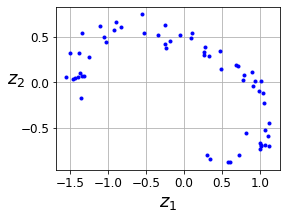

In [6]:
fig = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)

plt.show()

- Note that **the same dataset, X_train, is used as both the inputs and the targets.**
- Figure 17-2 shows the original 3D dataset (on the left) and the output of the autoencoder’s hidden layer (i.e., the coding layer, on the right).
- As you can see, the autoencoder found the best 2D plane to project the data onto, preserving as much variance in the data as it could (just like PCA)

<img src="17-2.png">

### NOTE
- You can think of autoencoders as a form of **self-supervised learning** (i.e., using a supervised learning technique with automatically generated labels, in this case simply equal to the inputs).

## Stacked Autoencoders
- Just like other neural networks we have discussed, autoencoders can have multiple hidden layers.
    - In this case they are called **stacked autoencoders** (or **deep autoencoders**).
- Adding more layers helps the autoencoder learn more complex codings.
    - That said, **one must be careful not to make the autoencoder too powerful.**
- Imagine an encoder so powerful that it just learns to map each input to a single arbitrary number (and the decoder learns the reverse mapping).
    - Obviously such an autoencoder will reconstruct the training data perfectly, **but it will not have learned any useful data representation in the process (and it is unlikely to generalize well to new instances).**
- **The architecture of a stacked autoencoder is typically symmetrical with regard to the central hidden layer (the coding layer).**
    - To put it simply, **it looks like a sandwich.**
- For example, an autoencoder for MNIST may have 784 inputs, followed by a hidden layer with 100 neurons, then a central hidden layer of 30 neurons, then another hidden layer with 100 neurons, and an output layer with 784 neurons.
    - This stacked autoencoder is represented in Figure 17-3.

<img src="17-3.png">

## Implementing a Stacked Autoencoder Using Keras
- You can implement a stacked autoencoder very much like a regular deep MLP.
- For example, the following code builds a stacked autoencoder for Fashion MNIST, using the SELU activation function:

Let's first load and normalize the dataset.

In [7]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

### Train all layers at once
Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [8]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [9]:
tf.random.set_seed(42)
np.random.seed(42)

stacked_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])

stacked_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(lr=1.5),
                   metrics=[rounded_accuracy])

history = stacked_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_valid, X_valid))

Epoch 1/20
1719/1719 [==============================] - 10s 5ms/step - loss: 0.3814 - rounded_accuracy: 0.8487 - val_loss: 0.3166 - val_rounded_accuracy: 0.9004
Epoch 2/20
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3082 - rounded_accuracy: 0.9127 - val_loss: 0.3020 - val_rounded_accuracy: 0.9200
Epoch 3/20
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2997 - rounded_accuracy: 0.9204 - val_loss: 0.2985 - val_rounded_accuracy: 0.9200
Epoch 4/20
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2959 - rounded_accuracy: 0.9240 - val_loss: 0.2938 - val_rounded_accuracy: 0.9285
Epoch 5/20
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2928 - rounded_accuracy: 0.9268 - val_loss: 0.2919 - val_rounded_accuracy: 0.9286
Epoch 6/20
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2920 - rounded_accuracy: 0.9283 - val_loss: 0.2915 - val_rounded_accuracy: 0.9305
Epoch 7/20
1719/1719 [=============

Let’s go through this code:
- Just like earlier, we split the autoencoder model into two submodels: the encoder and the decoder.
- **The encoder takes 28 × 28–pixel grayscale images, flattens them so that each image is represented as a vector of size 784, then processes these vectors through two Dense layers of diminishing sizes (100 units then 30 units), both using the SELU activation function (you may want to add LeCun normal initialization as well, but the network is not very deep so it won’t make a big difference).**
    - **For each input image, the encoder outputs a vector of size 30.**
- **The decoder takes codings of size 30 (output by the encoder) and processes them through two Dense layers of increasing sizes (100 units then 784 units), and it reshapes the final vectors into 28 × 28 arrays so the decoder’s outputs have the same shape as the encoder’s inputs.**
- **When compiling the stacked autoencoder**, we use the **binary crossentropy loss** instead of the mean squared error. 
    - We are **treating the reconstruction task as a multilabel binary classification problem:** each pixel intensity represents the probability that the pixel should be black. 
    - Framing it this way (rather than as a regression problem) tends to make the model converge faster.
- **Finally, we train the model using X_train as both the inputs and the targets (and similarly, we use X_valid as both the validation inputs and targets).**

### Visualizing the Reconstructions
- One way to ensure that an autoencoder is properly trained is to compare the inputs and the outputs: the differences should not be too significant.

Let’s plot a few images from the validation set, as well as their reconstructions:

In [10]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

In [11]:
def show_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + image_index + n_images)
        plot_image(reconstructions[image_index])

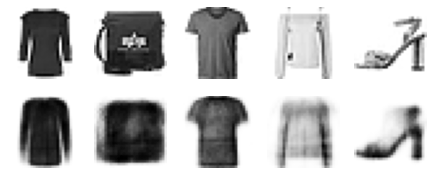

In [12]:
show_reconstructions(stacked_ae)

- The reconstructions are recognizable, but a bit too lossy. 
    - **We may need to train the model for longer, or make the encoder and decoder deeper, or make the codings larger.**
    - **But if we make the network too powerful, it will manage to make perfect reconstructions without having learned any useful patterns in the data.** 
    - For now, let’s go with this model.

### Visualizing the Fashion MNIST Dataset
- Now that we have trained a stacked autoencoder, we can use it to reduce the dataset’s dimensionality. 
- For visualization, this does not give great results compared to other dimensionality reduction algorithms, but **one big advantage of autoencoders is that they can handle large datasets, with many instances and many features.**
- **So one strategy is to use an autoencoder to reduce the dimensionality down to a reasonable level, then use another dimensionality reduction algorithm for visualization.**
- Let’s use this strategy to visualize Fashion MNIST.
    - **First, we use the encoder from our stacked autoencoder to reduce the dimensionality down to 30, then** we use Scikit-Learn’s implementation of the **t-SNE algorithm to reduce the dimensionality down to 2 for visualization:**

In [13]:
np.random.seed(42)

from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)
X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())

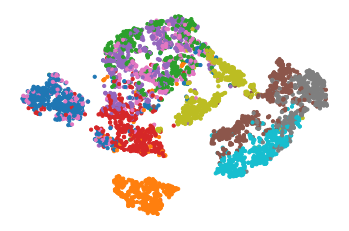

In [14]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.axis("off")
plt.show()

Let's make this diagram a bit prettier:

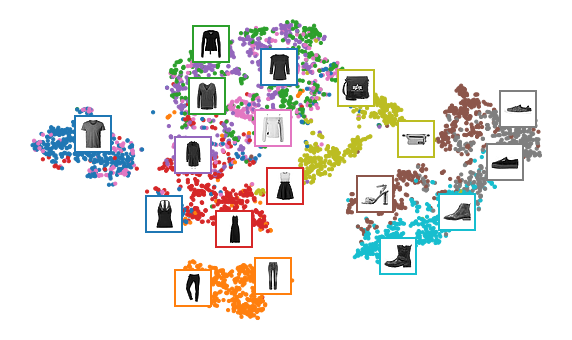

In [15]:
plt.figure(figsize=(10, 6))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: #If far enough from the other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)

plt.axis("off")
plt.show()

So, **autoencoders can be used for dimensionality reduction**. Another application is for **unsupervised pretraining.**

### Unsupervised Pretraining Using Stacked Autoencoders
- **If you are tackling a complex supervised task but you do not have a lot of labeled training data, one solution is to find a neural network that performs a similar task and reuse its lower layers.**
    - This makes it possible to train a high-performance model using little training data because your neural network won’t have to learn all the lowlevel features; it will just reuse the feature detectors learned by the existing network.
- Similarly, if you have a large dataset but most of it is unlabeled, you can **first train a stacked autoencoder using all the data, then reuse the lower layers to create a neural network for your actual task and train it using the labeled data.**
- For example, Figure 17-6 shows how to use a stacked autoencoder to perform unsupervised pretraining for a classification neural network. 
    - When training the classifier, if you really don’t have much labeled training data, you may want to freeze the pretrained layers (at least the lower ones).

<img src="17-6.png">
### NOTE
- Having plenty of unlabeled data and little labeled data is common. 
- Building a large unlabeled dataset is often cheap (e.g., a simple script can download millions of images off the internet), but labeling those images (e.g., classifying them as cute or not) can usually be done reliably only by humans. 
    - Labeling instances is time-consuming and costly, so it’s normal to have only a few thousand human-labeled instances.

***
- There is nothing special about the implementation: **just train an autoencoder using all the training data (labeled plus unlabeled), then reuse its encoder layers to create a new neural network.**

Next, let’s look at a few techniques for training stacked autoencoders.

### Tying Weights
- When an autoencoder is neatly symmetrical, like the one we just built, a common technique is to **tie the weights of the decoder layers to the weights of the encoder layers.**
    - This halves the number of weights in the model, speeding up training and limiting the risk of overfitting.
- For this, we need to use a custom layer.

In [16]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)
    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias",
                                      shape=[self.dense.input_shape[-1]],
                                      initializer="zeros")
        super().build(batch_input_shape)
    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

- This custom layer acts like a regular Dense layer, but it uses another Dense layer’s weights, transposed (setting transpose_b=True is equivalent to transposing the second argument, but it’s more efficient as it performs the transposition on the fly within the matmul() operation).
    - However, it uses its own bias vector.
- Next, we can build a new stacked autoencoder, much like the previous one, but with the decoder’s Dense layers tied to the encoder’s Dense layers:

In [17]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")

tied_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    dense_1,
    dense_2
])

tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2, activation="selu"),
    DenseTranspose(dense_1, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

tied_ae.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(lr=1.5),
                metrics=[rounded_accuracy])

history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3701 - rounded_accuracy: 0.8581 - val_loss: 0.3081 - val_rounded_accuracy: 0.9077
Epoch 2/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2998 - rounded_accuracy: 0.9201 - val_loss: 0.2951 - val_rounded_accuracy: 0.9285
Epoch 3/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2928 - rounded_accuracy: 0.9267 - val_loss: 0.3018 - val_rounded_accuracy: 0.9086
Epoch 4/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2898 - rounded_accuracy: 0.9293 - val_loss: 0.2880 - val_rounded_accuracy: 0.9333
Epoch 5/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.2869 - rounded_accuracy: 0.9321 - val_loss: 0.2874 - val_rounded_accuracy: 0.9314
Epoch 6/10
1719/1719 [==============================] - 15s 8ms/step - loss: 0.2866 - rounded_accuracy: 0.9334 - val_loss: 0.2860 - val_rounded_accuracy: 0.9354
Epoch 7/10
1719/1719 [============

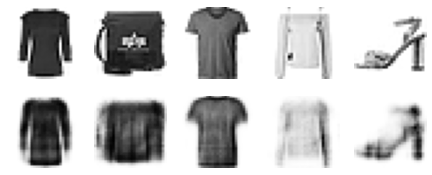

In [18]:
show_reconstructions(tied_ae)
plt.show()

This model achieves a very slightly lower reconstruction error than the previous model, with almost half the number of parameters.

### Training One Autoencoder at a Time
- Rather than training the whole stacked autoencoder in one go like we just did, it is possible to train one shallow autoencoder at a time, then stack all of them into a single stacked autoencoder (hence the name), as shown in Figure 17-7.
    - This technique is not used as much these days, but you may still run into papers that talk about “greedy layerwise training,” so it’s good to know what it means.

<img src="17-7.png">

In [19]:
def train_autoencoder(n_neurons, X_train, X_valid, loss, optimizer,
                      n_epochs=10, output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs])
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)

In [20]:
tf.random.set_seed(42)
np.random.seed(42)

K = keras.backend
X_train_flat = K.batch_flatten(X_train) # equivalent to .reshape(-1, 28 * 28)
X_valid_flat = K.batch_flatten(X_valid)

enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat, "binary_crossentropy",
    keras.optimizers.SGD(lr=1.5), output_activation="sigmoid",
    metrics=[rounded_accuracy])
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, "mse", keras.optimizers.SGD(lr=0.05),
    output_activation="selu")

Epoch 1/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3952 - rounded_accuracy: 0.8460 - val_loss: 0.3123 - val_rounded_accuracy: 0.9146
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3070 - rounded_accuracy: 0.9176 - val_loss: 0.3006 - val_rounded_accuracy: 0.9246
Epoch 3/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2967 - rounded_accuracy: 0.9267 - val_loss: 0.2934 - val_rounded_accuracy: 0.9317
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2906 - rounded_accuracy: 0.9328 - val_loss: 0.2888 - val_rounded_accuracy: 0.9363
Epoch 5/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2860 - rounded_accuracy: 0.9372 - val_loss: 0.2857 - val_rounded_accuracy: 0.9392
Epoch 6/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2844 - rounded_accuracy: 0.9396 - val_loss: 0.2834 - val_rounded_accuracy: 0.9409
Epoch 7/10
1719/1719 [===============

- During the first phase of training, the first autoencoder learns to reconstruct the inputs. 
    - Then we encode the whole training set using this first autoencoder, and this gives us a new (compressed) training set.
- We then train a second autoencoder on this new dataset. 
    - This is the second phase of training.
- Finally, we build a big sandwich using all these autoencoders, as shown in Figure 17-7 (i.e., we first stack the hidden layers of each autoencoder, then the output layers in reverse order). 
    - This gives us the final stacked autoencoder.
- We could easily train more autoencoders this way, building a very deep stacked autoencoder.

In [21]:
stacked_ae_1_by_1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    enc1, enc2, dec2, dec1,
    keras.layers.Reshape([28, 28])
])

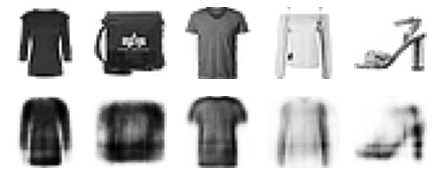

In [22]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

In [23]:
stacked_ae_1_by_1.compile(loss="binary_crossentropy",
                          optimizer=keras.optimizers.SGD(lr=0.1), metrics=[rounded_accuracy])
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=10,
                                validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2866 - rounded_accuracy: 0.9339 - val_loss: 0.2883 - val_rounded_accuracy: 0.9341
Epoch 2/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2866 - rounded_accuracy: 0.9345 - val_loss: 0.2881 - val_rounded_accuracy: 0.9347
Epoch 3/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2861 - rounded_accuracy: 0.9348 - val_loss: 0.2879 - val_rounded_accuracy: 0.9347
Epoch 4/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2863 - rounded_accuracy: 0.9349 - val_loss: 0.2877 - val_rounded_accuracy: 0.9350
Epoch 5/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2857 - rounded_accuracy: 0.9354 - val_loss: 0.2876 - val_rounded_accuracy: 0.9351
Epoch 6/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2868 - rounded_accuracy: 0.9352 - val_loss: 0.2874 - val_rounded_accuracy: 0.9350
Epoch 7/10
1719/1719 [============

Autoencoders are not limited to dense networks: you can also build convolutional autoencoders, or even recurrent autoencoders. <br>Let’s look at these now.

## Convolutional Autoencoders
- If you are dealing with images, then the autoencoders we have seen so far will not work well (unless the images are very small): convolutional neural networks are far better suited than dense networks to work with images.
- **So if you want to build an autoencoder for images** (e.g., for unsupervised pretraining or dimensionality reduction), you will need to build a **convolutional autoencoder.**
    - **The encoder is a regular CNN composed of convolutional layers and pooling layers. **
        - **It typically reduces the spatial dimensionality of the inputs (i.e., height and width) while increasing the depth (i.e., the number of feature maps).**
    - **The decoder must do the reverse (upscale the image and reduce its depth back to the original dimensions)**, and for this you can use **transpose convolutional layers** (alternatively, you could **combine upsampling layers with convolutional layers).**

Here is a simple convolutional autoencoder for Fashion MNIST (a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders)):

In [24]:
tf.random.set_seed(42)
np.random.seed(42)

conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2)
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu",
                                 input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.0),
                metrics=[rounded_accuracy])
history = conv_ae.fit(X_train, X_train, epochs=5,
                      validation_data=(X_valid, X_valid))

Epoch 1/5
1719/1719 [==============================] - 96s 55ms/step - loss: 0.3377 - rounded_accuracy: 0.8895 - val_loss: 0.2847 - val_rounded_accuracy: 0.9289
Epoch 2/5
1719/1719 [==============================] - 101s 59ms/step - loss: 0.2776 - rounded_accuracy: 0.9393 - val_loss: 0.2730 - val_rounded_accuracy: 0.9454
Epoch 3/5
1719/1719 [==============================] - 102s 59ms/step - loss: 0.2717 - rounded_accuracy: 0.9451 - val_loss: 0.2696 - val_rounded_accuracy: 0.9496
Epoch 4/5
1719/1719 [==============================] - 97s 56ms/step - loss: 0.2690 - rounded_accuracy: 0.9483 - val_loss: 0.2685 - val_rounded_accuracy: 0.9492
Epoch 5/5
1719/1719 [==============================] - 93s 54ms/step - loss: 0.2668 - rounded_accuracy: 0.9506 - val_loss: 0.2673 - val_rounded_accuracy: 0.9506


In [25]:
conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_2 (Reshape)          (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 28, 28, 16)        160       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 32)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 7, 7, 64)          18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 3, 3, 64)        

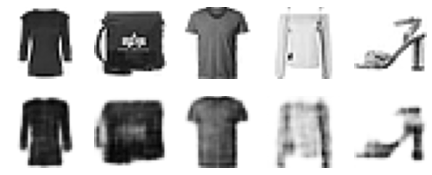

In [26]:
show_reconstructions(conv_ae)
plt.show()

## Recurrent Autoencoders
- If you want to build an autoencoder for sequences, such as time series or text (e.g., for unsupervised learning or dimensionality reduction), then recurrent neural networks may be better suited than dense networks.
- Building a recurrent autoencoder is straightforward: 
    - **The encoder** is typically a **sequence-to-vector RNN** which compresses the input sequence down to a single vector. 
    - **The decoder**is a **vector-to-sequence RNN** that does the reverse:

In [27]:
recurrent_encoder = keras.models.Sequential([
    keras.layers.LSTM(100, return_sequences=True, input_shape=[28, 28]),
    keras.layers.LSTM(30)
])

recurrent_decoder = keras.models.Sequential([
    keras.layers.RepeatVector(28, input_shape=[30]),
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid"))
])

recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])

recurrent_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=0.1),
                     metrics=[rounded_accuracy])

history = recurrent_ae.fit(X_train, X_train, epochs=10, 
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 192s 107ms/step - loss: 0.5628 - rounded_accuracy: 0.7075 - val_loss: 0.4581 - val_rounded_accuracy: 0.8081
Epoch 2/10
1719/1719 [==============================] - 183s 107ms/step - loss: 0.4278 - rounded_accuracy: 0.8285 - val_loss: 0.3744 - val_rounded_accuracy: 0.8681
Epoch 3/10
1719/1719 [==============================] - 187s 109ms/step - loss: 0.3698 - rounded_accuracy: 0.8677 - val_loss: 0.3603 - val_rounded_accuracy: 0.8768
Epoch 4/10
1719/1719 [==============================] - 187s 109ms/step - loss: 0.3542 - rounded_accuracy: 0.8787 - val_loss: 0.3524 - val_rounded_accuracy: 0.8772
Epoch 5/10
1719/1719 [==============================] - 182s 106ms/step - loss: 0.3423 - rounded_accuracy: 0.8865 - val_loss: 0.3362 - val_rounded_accuracy: 0.8925
Epoch 6/10
1719/1719 [==============================] - 181s 105ms/step - loss: 0.3357 - rounded_accuracy: 0.8911 - val_loss: 0.3306 - val_rounded_accuracy: 0.8961
Epoch 7/10
1719/

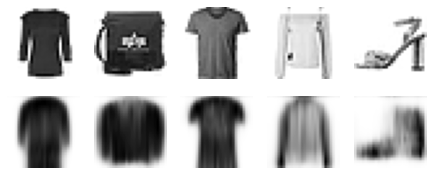

In [28]:
show_reconstructions(recurrent_ae)
plt.show()

- This recurrent autoencoder can process sequences of any length, with **28 dimensions per time step.**
- Conveniently, this means **it can process Fashion MNIST images by treating each image as a sequence of rows: at each time step, the RNN will process a single row of 28 pixels.**
    - Obviously, you could use a recurrent autoencoder for any kind of sequence.
- Note that **we use a RepeatVector layer as the first layer of the decoder, to ensure that its input vector gets fed to the decoder at each time step.**
***

- OK, let’s step back for a second. So far we have seen various kinds of autoencoders (basic, stacked, convolutional, and recurrent), and we have looked at how to train them (either in one shot or layer by layer). 
    - We also looked at a couple applications: data visualization and unsupervised pretraining.
- Up to now, in order to force the autoencoder to learn interesting features, we have limited the size of the coding layer, making it undercomplete.
- There are actually many other kinds of constraints that can be used, including ones that allow the coding layer to be just as large as the inputs, or even larger, resulting in an **overcomplete autoencoder.** 

Let’s look at some of those approaches now.

## Denoising Autoencoders
- Another way to force the autoencoder to learn useful features is to **add noise to its inputs, training it to recover the original, noise-free inputs.**
    - This idea has been around since the 1980s (e.g., it is mentioned in Yann LeCun’s 1987 master’s thesis).
    - In a 2008 paper, Pascal Vincent et al. showed that **autoencoders could also be used for feature extraction.** 
    - In a 2010 paper, Vincent et al. introduced **stacked denoising autoencoders.**
- The noise can be pure Gaussian noise added to the inputs, or it can be randomly switched-off inputs, just like in dropout.
- The implementation is straightforward: **it is a regular stacked autoencoder with an additional Dropout layer applied to the encoder’s inputs (or you could use a GaussianNoise layer instead).** 
    - Recall that the Dropout layer is only active during training (and so is the GaussianNoise layer):

### Stacked denoising Autoencoder
#### Using Gaussian noise:

In [29]:
tf.random.set_seed(42)
np.random.seed(42)

denoising_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.GaussianNoise(0.2),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])

denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])

denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.0),
                     metrics=[rounded_accuracy])

history = denoising_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 14s 7ms/step - loss: 0.4007 - rounded_accuracy: 0.8323 - val_loss: 0.3182 - val_rounded_accuracy: 0.9036
Epoch 2/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3146 - rounded_accuracy: 0.9075 - val_loss: 0.3087 - val_rounded_accuracy: 0.9156
Epoch 3/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3067 - rounded_accuracy: 0.9141 - val_loss: 0.3035 - val_rounded_accuracy: 0.9191
Epoch 4/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3032 - rounded_accuracy: 0.9173 - val_loss: 0.2999 - val_rounded_accuracy: 0.9207
Epoch 5/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2998 - rounded_accuracy: 0.9205 - val_loss: 0.2968 - val_rounded_accuracy: 0.9252
Epoch 6/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2985 - rounded_accuracy: 0.9222 - val_loss: 0.2947 - val_rounded_accuracy: 0.9272
Epoch 7/10
1719/1719 [============

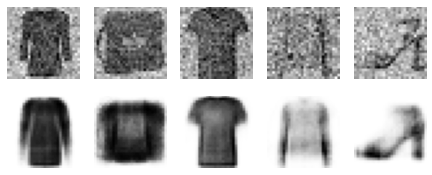

In [30]:
tf.random.set_seed(42)
np.random.seed(42)

noise = keras.layers.GaussianNoise(0.2)
show_reconstructions(denoising_ae, noise(X_valid, training=True))
plt.show()

#### Using dropout:

In [31]:
tf.random.set_seed(42)
np.random.seed(42)

dropout_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])

dropout_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])

dropout_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.0),
                   metrics=[rounded_accuracy])

history = dropout_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 13s 7ms/step - loss: 0.4073 - rounded_accuracy: 0.8261 - val_loss: 0.3200 - val_rounded_accuracy: 0.9040
Epoch 2/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3203 - rounded_accuracy: 0.9017 - val_loss: 0.3125 - val_rounded_accuracy: 0.9110
Epoch 3/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3136 - rounded_accuracy: 0.9066 - val_loss: 0.3075 - val_rounded_accuracy: 0.9153
Epoch 4/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3102 - rounded_accuracy: 0.9094 - val_loss: 0.3041 - val_rounded_accuracy: 0.9178
Epoch 5/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.3070 - rounded_accuracy: 0.9121 - val_loss: 0.3015 - val_rounded_accuracy: 0.9193
Epoch 6/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3063 - rounded_accuracy: 0.9132 - val_loss: 0.3014 - val_rounded_accuracy: 0.9172
Epoch 7/10
1719/1719 [============

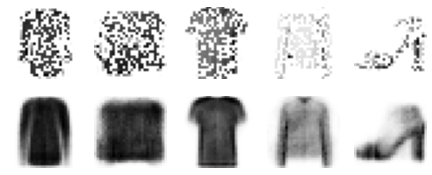

In [32]:
tf.random.set_seed(42)
np.random.seed(42)

dropout = keras.layers.Dropout(0.5)
show_reconstructions(dropout_ae, dropout(X_valid, training=True))
plt.show()

- Plot above shows a few noisy images (with half the pixels turned off), and the images reconstructed by the dropout-based denoising autoencoder.
    - Notice how the autoencoder guesses details that are actually not in the input, such as the top of the white shirt (bottom row, fourth image).
- As you can see, not only can denoising autoencoders be used for data visualization or unsupervised pretraining, like the other autoencoders we’ve discussed so far, but they can also be used quite simply and efficiently **to remove noise from images.**

## Sparse Autoencoders
- Another kind of constraint that often leads to good feature extraction is **sparsity**: by adding an appropriate term to the cost function, **the autoencoder is pushed to reduce the number of active neurons in the coding layer.**
- For example, it may be pushed to have on average only 5% significantly active neurons in the coding layer.
    - This forces the autoencoder to represent each input as a combination of a small number of activations.
- As a result, each neuron in the coding layer typically ends up representing a useful feature (if you could speak only a few words per month, you would probably try to make them worth listening to).

Let's build a simple stacked autoencoder, so we can compare it to the sparse autoencoders we will build. This time we will use the **sigmoid activation function for the coding layer, to ensure that the coding values range from 0 to 1:**

In [33]:
tf.random.set_seed(42)
np.random.seed(42)

simple_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="sigmoid")
])

simple_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

simple_ae = keras.models.Sequential([simple_encoder, simple_decoder])

simple_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.0),
                  metrics=[rounded_accuracy])

history = simple_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 12s 6ms/step - loss: 0.4876 - rounded_accuracy: 0.7450 - val_loss: 0.3773 - val_rounded_accuracy: 0.8492
Epoch 2/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3679 - rounded_accuracy: 0.8591 - val_loss: 0.3514 - val_rounded_accuracy: 0.8797
Epoch 3/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3442 - rounded_accuracy: 0.8824 - val_loss: 0.3367 - val_rounded_accuracy: 0.8912
Epoch 4/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3317 - rounded_accuracy: 0.8930 - val_loss: 0.3263 - val_rounded_accuracy: 0.8992
Epoch 5/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3223 - rounded_accuracy: 0.9007 - val_loss: 0.3210 - val_rounded_accuracy: 0.9032
Epoch 6/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3194 - rounded_accuracy: 0.9030 - val_loss: 0.3179 - val_rounded_accuracy: 0.9050
Epoch 7/10
1719/1719 [============

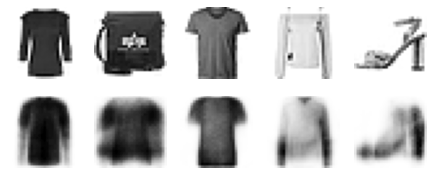

In [34]:
show_reconstructions(simple_ae)
plt.show()

Let's create a couple functions to print nice activation histograms:

In [35]:
def plot_percent_hist(ax, data, bins):
    counts, _ = np.histogram(data, bins=bins)
    widths = bins[1:] - bins[:-1]
    x = bins[:-1] + widths / 2
    ax.bar(x, counts / len(data), width=widths*0.8)
    ax.xaxis.set_ticks(bins)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(
        lambda y, position: "{}%".format(int(np.round(100 * y)))))
    ax.grid(True)

In [36]:
def plot_activations_histogram(encoder, height=1, n_bins=10):
    X_valid_codings = encoder(X_valid).numpy()
    activation_means = X_valid_codings.mean(axis=0)
    mean = activation_means.mean()
    bins = np.linspace(0, 1, n_bins + 1)

    fig, [ax1, ax2] = plt.subplots(figsize=(10, 3), nrows=1, ncols=2, sharey=True)
    plot_percent_hist(ax1, X_valid_codings.ravel(), bins)
    ax1.plot([mean, mean], [0, height], "k--", label="Overall Mean = {:.2f}".format(mean))
    ax1.legend(loc="upper center", fontsize=14)
    ax1.set_xlabel("Activation")
    ax1.set_ylabel("% Activations")
    ax1.axis([0, 1, 0, height])
    plot_percent_hist(ax2, activation_means, bins)
    ax2.plot([mean, mean], [0, height], "k--")
    ax2.set_xlabel("Neuron Mean Activation")
    ax2.set_ylabel("% Neurons")
    ax2.axis([0, 1, 0, height])

Let's use these functions to plot histograms of the activations of the encoding layer. 
- The histogram on the left shows the distribution of all the activations.
    -  You can see that values close to 0 or 1 are more frequent overall, which is consistent with the saturating nature of the sigmoid function.
- The histogram on the right shows the distribution of mean neuron activations: you can see that most neurons have a mean activation close to 0.5.
- Both histograms tell us that each neuron tends to either fire close to 0 or 1, with about 50% probability each. 
    - However, some neurons fire almost all the time (right side of the right histogram).

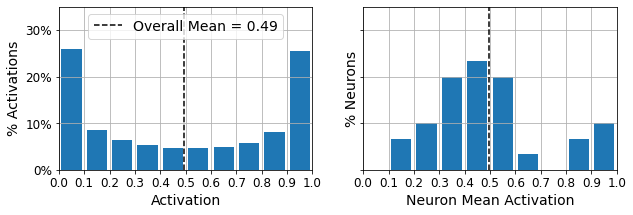

In [37]:
plot_activations_histogram(simple_encoder, height=0.35)
plt.show()

- A simple approach is to use the sigmoid activation function in the coding layer (to constrain the codings to values between 0 and 1), use a large coding layer (e.g., with 300 units), and add some ℓ regularization to the coding layer’s activations (the decoder is just a regular decoder):

In [38]:
tf.random.set_seed(42)
np.random.seed(42)

sparse_l1_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid"),
    keras.layers.ActivityRegularization(l1=1e-3)
# Alternatively, you could add activity_regularizer=keras.regularizers.l1(1e-3) to the previous layer.
])

sparse_l1_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])

sparse_l1_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.0),
                     metrics=[rounded_accuracy])

history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 16s 9ms/step - loss: 0.4971 - rounded_accuracy: 0.7657 - val_loss: 0.3808 - val_rounded_accuracy: 0.8555
Epoch 2/10
1719/1719 [==============================] - 13s 8ms/step - loss: 0.3733 - rounded_accuracy: 0.8649 - val_loss: 0.3638 - val_rounded_accuracy: 0.8741
Epoch 3/10
1719/1719 [==============================] - 13s 7ms/step - loss: 0.3578 - rounded_accuracy: 0.8773 - val_loss: 0.3502 - val_rounded_accuracy: 0.8857
Epoch 4/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3460 - rounded_accuracy: 0.8860 - val_loss: 0.3418 - val_rounded_accuracy: 0.8898
Epoch 5/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3383 - rounded_accuracy: 0.8914 - val_loss: 0.3368 - val_rounded_accuracy: 0.8949
Epoch 6/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3342 - rounded_accuracy: 0.8953 - val_loss: 0.3316 - val_rounded_accuracy: 0.8992
Epoch 7/10
1719/1719 [============

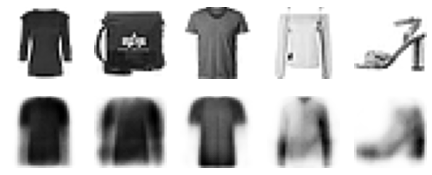

In [39]:
show_reconstructions(sparse_l1_ae)
plt.show()

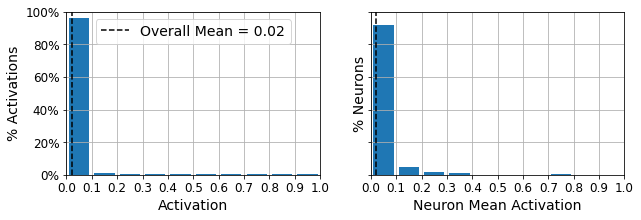

In [40]:
plot_activations_histogram(sparse_l1_encoder, height=1.)
plt.show()

- This **ActivityRegularization layer just returns its inputs, but as a side effect it adds a training loss equal to the sum of absolute values of its inputs (this layer only has an effect during training).**
    - Equivalently, you could remove the ActivityRegularization layer and set activity_regularizer=keras.regularizers.l1(1e-3) in the previous layer.
- **This penalty will encourage the neural network to produce codings close to 0**, but since it will also be penalized if it does not reconstruct the inputs correctly, it will have to output at least a few nonzero values.
- Using the $ℓ_1$  norm rather than the $ℓ_2$ norm **will push the neural network to preserve the most important codings while eliminating the ones that are not needed for the input image (rather than just reducing all codings).**
***

- Another approach, which often yields better results, is to **measure the actual sparsity of the coding layer at each training iteration, and penalize the model when the measured sparsity differs from a target sparsity.**
    - **We do so by computing the average activation of each neuron in the coding layer, over the whole training batch.** 
    - The **batch size must not be too small**, or else the mean will not be accurate.
- **Once we have the mean activation per neuron, we want to penalize the neurons that are too active, or not active enough, by adding a sparsity loss to the cost function.**
    - For example, if we measure that a neuron has an average activation of 0.3, but the target sparsity is 0.1, it must be penalized to activate less.
- One approach could be simply adding the squared error (0.3 – 0.1)² to the cost function, but in practice a better approach is to use **the Kullback–Leibler (KL) divergence**, which has much stronger gradients than the mean squared error.

Let's use the KL Divergence loss instead to ensure sparsity, and target 10% sparsity rather than 0%:

(0.0, 1.0, 0.0, 0.95)

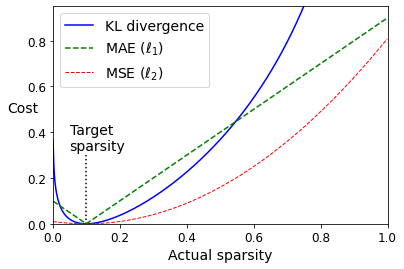

In [41]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q)**2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])

- **Once we have computed the sparsity loss for each neuron in the coding layer, we sum up these losses and add the result to the cost function.**
- In order to control the relative importance of the sparsity loss and the reconstruction loss, we can multiply the sparsity loss by a sparsity weight hyperparameter.
- If this weight is too high, the model will stick closely to the target sparsity, but it may not reconstruct the inputs properly, making the model useless.
    - Conversely, if it is too low, the model will mostly ignore the sparsity objective and will not learn any interesting features.
- We now have all we need to implement a sparse autoencoder based on the KL divergence. 

First, let’s create a custom regularizer to apply KL divergence regularization:

In [42]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target
    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

Now we can build **the sparse autoencoder**, using the KLDivergenceRegularizer for the coding layer’s activations:

In [43]:
tf.random.set_seed(42)
np.random.seed(42)

kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)

sparse_kl_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
])

sparse_kl_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])

sparse_kl_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.0),
              metrics=[rounded_accuracy])

history = sparse_kl_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 14s 7ms/step - loss: 0.4753 - rounded_accuracy: 0.7629 - val_loss: 0.3716 - val_rounded_accuracy: 0.8564
Epoch 2/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3606 - rounded_accuracy: 0.8686 - val_loss: 0.3442 - val_rounded_accuracy: 0.8847
Epoch 3/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3374 - rounded_accuracy: 0.8887 - val_loss: 0.3293 - val_rounded_accuracy: 0.8975
Epoch 4/10
1719/1719 [==============================] - 13s 7ms/step - loss: 0.3247 - rounded_accuracy: 0.9000 - val_loss: 0.3213 - val_rounded_accuracy: 0.9043
Epoch 5/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3178 - rounded_accuracy: 0.9057 - val_loss: 0.3171 - val_rounded_accuracy: 0.9078
Epoch 6/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3153 - rounded_accuracy: 0.9083 - val_loss: 0.3140 - val_rounded_accuracy: 0.9105
Epoch 7/10
1719/1719 [============

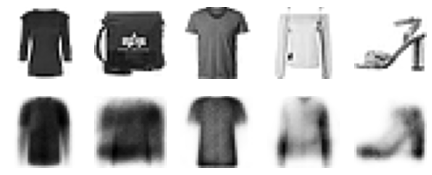

In [44]:
show_reconstructions(sparse_kl_ae)
plt.show()

After training this sparse autoencoder on Fashion MNIST, the activations of the neurons in the coding layer are mostly close to 0 (about 70% of all activations are lower than 0.1), and all neurons have a mean activation around 0.1 (about 90% of all neurons have a mean activation between 0.1 and 0.2).

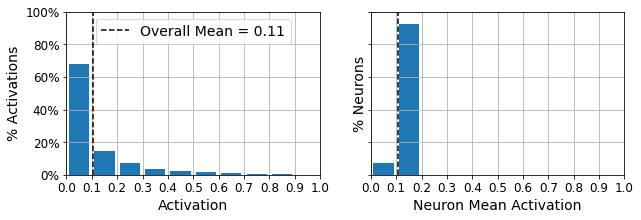

In [45]:
plot_activations_histogram(sparse_kl_encoder)
plt.show()

## Variational Autoencoders
- Another important category of autoencoders was introduced in 2013 by Diederik Kingma and Max Welling and quickly became one of the most popular types of autoencoders: **variational autoencoders**.
- They are quite different from all the autoencoders we have discussed so far, in these particular ways:
    - They are **probabilistic autoencoders**, meaning that their outputs are partly determined by chance, even after training (as opposed to denoising autoencoders, which use randomness only during training).
    - Most importantly, they are **generative autoencoders**, meaning that they can generate new instances that look like they were sampled from the training set.
- Both these properties make them rather similar to RBMs, but they are easier to train, and the sampling process is much faster (with RBMs you need to wait for the network to stabilize into a “thermal equilibrium” before you can sample a new instance).
- Indeed, as their name suggests, variational autoencoders perform variational Bayesian inference, which is an efficient way to perform approximate Bayesian inference.

Let’s take a look at how they work. Figure 17-12 (left) shows a variational autoencoder.
- You can recognize the basic structure of all autoencoders, with an encoder followed by a decoder (in this example, they both have two hidden layers), but there is a twist: instead of directly producing a coding for a given input, **the encoder produces a mean coding μ and a standard deviation σ.**
    - The actual coding is then sampled randomly from a Gaussian distribution with mean μ and standard deviation σ.
    - After that the decoder decodes the sampled coding normally.
- The right part of the diagram shows a training instance going through this autoencoder.
    - First, the encoder produces μ and σ, then a coding is sampled randomly (notice that it is not exactly located at μ), and finally this coding is decoded; the final output resembles the training instance.

<img src="17-12.png">

- As you can see in the diagram, although the inputs may have a very convoluted distribution, a variational autoencoder tends to produce codings that look as though they were sampled from a simple Gaussian distribution: during training, the cost function pushes the codings to gradually migrate within **the coding space** (also called **the latent space**) to end up looking like a cloud of Gaussian points.
- One great consequence is that **after training a variational autoencoder, you can very easily generate a new instance: just sample a random coding from the Gaussian distribution, decode it, and voilà!**
***
- Now, let’s look at the cost function. It is composed of two parts.
    - **The first is the usual reconstruction loss that pushes the autoencoder to reproduce its inputs** (we can use cross entropy for this, as discussed earlier).
    - The second is **the latent loss** that pushes the autoencoder to have codings that look as though they were sampled from a simple Gaussian distribution: it is the KL divergence between the target distribution (i.e., the Gaussian distribution) and the actual distribution of the codings.
- The math is a bit more complex than with the sparse autoencoder, in particular because of the Gaussian noise, which limits the amount of information that can be transmitted to the coding layer (thus pushing the autoencoder to learn useful features).
    - Luckily, the equations simplify, so the latent loss can be computed quite simply using Equation 17-3:

<img src="eq3.png">

- In this equation, L is the latent loss, n is the codings’ dimensionality, and μ<sub>i</sub> and σ<sub>i</sub> are the mean and standard deviation of the i<sup>th</sup> component of the codings.
    - The vectors μ and σ (which contain all the  μ<sub>i</sub> and σ<sub>i</sub> ) are output by the encoder, as shown in Figure 17-12 (left).
- A common tweak to the variational autoencoder’s architecture is to **make the encoder output γ = log(σ<sup>2</sup>)** rather than σ.
    - The latent loss can then be computed as shown in Equation 17-4. 
    - **This approach is more numerically stable and speeds up training.**

<img src="eq4.png">

- Let’s start building a variational autoencoder for Fashion MNIST (as shown in Figure 17-12, but using the γ tweak). 
    - First, we will need a custom layer to sample the codings, given μ and γ:

In [46]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean 

- This Sampling layer takes two inputs: mean (μ) and log_var (γ). 
    - It uses the function K.random_normal() to sample a random vector (of the same shape as γ) from the Normal distribution, with mean 0 and standard deviation 1. 
    - Then it multiplies it by exp(γ / 2) (which is equal to σ, as you can verify), and finally it adds μ and returns the result. 
    - This samples a codings vector from the Normal distribution with mean μ and standard deviation σ.

- Next, we can create **the encoder**, using the **Functional API** because the model is not entirely sequential:

In [47]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 10

inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])

variational_encoder = keras.models.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

- Note that the Dense layers that output codings_mean (μ) and codings_log_var (γ) have the same inputs (i.e., the outputs of the second Dense layer).
    - We then pass both codings_mean and codings_log_var to the Sampling layer.
    - Finally, the variational_encoder model has three outputs, in case you want to inspect the values of codings_mean and codings_log_var.
    - **The only output we will use is the last one (codings).**

Now let’s build **the decoder**:

In [48]:
decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)

variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

- For this decoder, we could have used the Sequential API instead of the Functional API, since it is really just a simple stack of layers, virtually identical to many of the decoders we have built so far. 
- Finally, let’s build **the variational autoencoder model**:

In [49]:
_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

- Note that **we ignore the first two outputs of the encoder (we only want to feed the codings to the decoder).** 
- Lastly, **we must add the latent loss and the reconstruction loss:**

In [50]:
latent_loss = -0.5 * K.sum(
    1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean),
    axis=-1)
variational_ae.add_loss(K.mean(latent_loss) / 784.)
variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[rounded_accuracy])

- We first apply Equation 17-4 to compute the latent loss for each instance in the batch (we sum over the last axis).
- Then we compute the mean loss over all the instances in the batch, and we divide the result by 784 to ensure it has the appropriate scale compared to the reconstruction loss.
- Indeed, the variational autoencoder’s reconstruction loss is supposed to be the sum of the pixel reconstruction errors, but when Keras computes the "binary_crossentropy" loss, it computes the mean over all 784 pixels, rather than the sum.
    - So, the reconstruction loss is 784 times smaller than we need it to be.
- We could define a custom loss to compute the sum rather than the mean, but it is simpler to divide the latent loss by 784 (the final loss will be 784 times smaller than it should be, but this just means that we should use a larger learning rate).
- Note that we use the RMSprop optimizer, which works well in this case. 

And finally we can train the autoencoder!

In [51]:
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128,
                             validation_data=(X_valid, X_valid))

Epoch 1/25
430/430 [==============================] - 14s 25ms/step - loss: 0.4435 - rounded_accuracy: 0.8159 - val_loss: 0.3524 - val_rounded_accuracy: 0.8962
Epoch 2/25
430/430 [==============================] - 10s 23ms/step - loss: 0.3461 - rounded_accuracy: 0.8953 - val_loss: 0.3398 - val_rounded_accuracy: 0.9043
Epoch 3/25
430/430 [==============================] - 9s 21ms/step - loss: 0.3340 - rounded_accuracy: 0.9043 - val_loss: 0.3331 - val_rounded_accuracy: 0.9082
Epoch 4/25
430/430 [==============================] - 8s 19ms/step - loss: 0.3290 - rounded_accuracy: 0.9083 - val_loss: 0.3261 - val_rounded_accuracy: 0.9106
Epoch 5/25
430/430 [==============================] - 8s 20ms/step - loss: 0.3254 - rounded_accuracy: 0.9114 - val_loss: 0.3262 - val_rounded_accuracy: 0.9145
Epoch 6/25
430/430 [==============================] - 9s 21ms/step - loss: 0.3242 - rounded_accuracy: 0.9131 - val_loss: 0.3253 - val_rounded_accuracy: 0.9134
Epoch 7/25
430/430 [========================

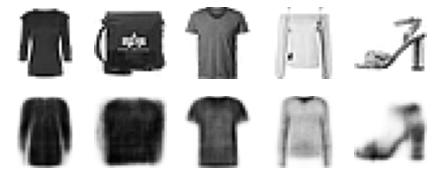

In [52]:
show_reconstructions(variational_ae)
plt.show()

### Generating Fashion MNIST Images
Now let’s use this variational autoencoder to generate images that look like fashion items. 
- All we need to do is **sample random codings from a Gaussian distribution and decode them:**

In [53]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Let's generate a few random codings, decode them and plot the resulting images:

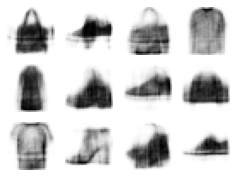

In [54]:
tf.random.set_seed(42)

codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4)

- The majority of these images look fairly convincing, if a bit too fuzzy. The rest are not great, but don’t be too harsh on the autoencoder, it only had a few minutes to learn! Give it a bit more fine-tuning and training time, and those images should look better.
- Variational autoencoders make it possible to perform **semantic interpolation**: instead of interpolating two images at the pixel level (which would look as if the two images were overlaid), we can interpolate at the codings level.
- We first run both images through the encoder, then we interpolate the two codings we get, and finally we decode the interpolated codings to get the final image.
    - It will look like a regular Fashion MNIST image, but it will be an intermediate between the original images.

- In the following code example, we take the 12 codings we just generated, we organize them in a 3 × 4 grid, and we use TensorFlow’s **tf.image.resize()** function to resize this grid to 5 × 7.
- By default, the **resize()** function will perform bilinear interpolation, so every other row and column will contain interpolated codings. 
    - **We then use the decoder to produce all the images:**

Now let's perform semantic interpolation between these images:

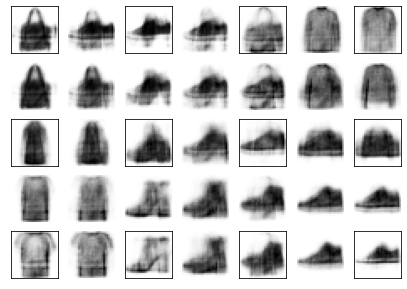

In [55]:
tf.random.set_seed(42)
np.random.seed(42)

codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
larger_grid = tf.image.resize(codings_grid, size=[5, 7])
interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
images = variational_decoder(interpolated_codings).numpy()

plt.figure(figsize=(7, 5))
for index, image in enumerate(images):
    plt.subplot(5, 7, index + 1)
    if index%7%2==0 and index//7%2==0:
        plt.gca().get_xaxis().set_visible(False)
        plt.gca().get_yaxis().set_visible(False)
    else:
        plt.axis("off")
    plt.imshow(image, cmap="binary")

- The **original images are framed**, and the rest are the result of semantic interpolation between the nearby images.
- For several years, variational autoencoders were quite popular, but **GANs** eventually took the lead, in particular because they are capable of generating much more realistic and crisp images. 

So let’s turn our attention to GANs.

## Generative Adversarial Networks
- Generative adversarial networks were proposed in a 2014 paper by Ian Goodfellow et al., and although the idea got researchers excited almost instantly, it took a few years to overcome some of the difficulties of training GANs.
    - Like many great ideas, it seems simple in hindsight: make neural networks compete against each other in the hope that this competition will push them to excel.
- As shown in Figure 17-15, a GAN is composed of two neural networks:

#### Generator
- **Takes a random distribution as input (typically Gaussian) and outputs some data—typically, an image.**
    - You can think of the random inputs as the latent representations (i.e., codings) of the image to be generated.
- So, as you can see, **the generator offers the same functionality as a decoder in a variational autoencoder**, and it can be used in the same way to generate new images (just feed it some Gaussian noise, and it outputs a brand-new image).
    - However, it is trained very differently, as we will soon see.

#### Discriminator
- **Takes either a fake image from the generator or a real image from the training set as input, and must guess whether the input image is fake or real.**

<img src="17-15.png">

- **During training, the generator and the discriminator have opposite goals: the discriminator tries to tell fake images from real images, while the generator tries to produce images that look real enough to trick the discriminator.**
- **Because the GAN is composed of two networks with different objectives, it cannot be trained like a regular neural network. Each training iteration is divided into two phases:**
    - **In the first phase, we train the discriminator.**
        - A batch of real images is sampled from the training set and is completed with an equal number of fake images produced by the generator.
        - The labels are set to **0 for fake images** and **1 for real images**, and the discriminator is trained on this labeled batch for one step, using the binary cross-entropy loss.
        - Importantly, **backpropagation only optimizes the weights of the discriminator during this phase.**
    - **In the second phase, we train the generator.**
        - We first use it to produce another batch of fake images, and once again the discriminator is used to tell whether the images are fake or real.
        - **This time we do not add real images in the batch, and all the labels are set to 1 (real): in other words, we want the generator to produce images that the discriminator will (wrongly) believe to be real!**
        - Crucially, **the weights of the discriminator are frozen during this step, so backpropagation only affects the weights of the generator.**

#### NOTE
- **The generator never actually sees any real images**, yet it gradually learns to produce convincing fake images! All it gets is the gradients flowing back through the discriminator. 
- Fortunately, the better the discriminator gets, the more information about the real images is contained in these secondhand gradients, so the generator can make significant progress.

Let’s go ahead and build a simple GAN for Fashion MNIST. 
- **First, we need to build the generator and the discriminator.**
    - **The generator is similar to an autoencoder’s decoder**, and **the discriminator is a regular binary classifier** (it takes an image as input and ends with a Dense layer containing a single unit and using the sigmoid activation function).
- For the second phase of each training iteration, we also need the full GAN model containing the generator followed by the discriminator:

In [56]:
np.random.seed(42)
tf.random.set_seed(42)

codings_size = 30

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])

gan = keras.models.Sequential([generator, discriminator])

Next, we need to compile these models.
- As **the discriminator is a binary classifier**, we can naturally use the **binary cross-entropy loss.**
- **The generator will only be trained through the gan model, so we do not need to compile it at all.**
- **The gan model is also a binary classifier, so it can use the binary cross-entropy loss.**
- Importantly, **the discriminator should not be trained during the second phase**, so we **make it non-trainable before compiling the gan model:**

In [57]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

#### NOTE
- The **trainable** attribute is taken into account by Keras **only when compiling a model**, so **after running this code, the discriminator is trainable if we call its fit() method or its train_on_batch() method** (which we will be using), while it is not trainable when we call these methods on the gan model.

***
- Since the training loop is unusual, **we cannot use the regular fit() method.**
- Instead, we will write a custom training loop. 
- For this, we first need to create a Dataset to iterate through the images:

In [58]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

We are now ready to write the training loop. Let’s wrap it in a train_gan() function:

In [59]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)
        plt.show()

Epoch 1/1


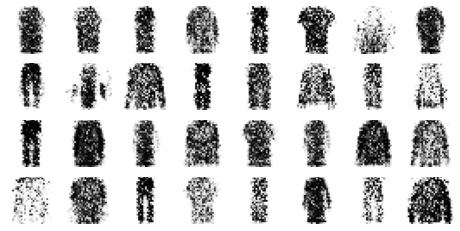

In [60]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

As discussed earlier, you can see the two phases at each iteration:
- In phase one we feed Gaussian noise to the generator to produce fake images, and we complete this batch by concatenating an equal number of real images.
    - **The targets y1 are set to 0 for fake images and 1 for real images.**
    - Then we **train the discriminator on this batch.**
    - Note that we set the discriminator’s trainable attribute to True: this is only to get rid of a warning that Keras displays when it notices that trainable is now False but was True when the model was compiled (or vice versa).
- In phase two, we feed the GAN some Gaussian noise.
    - Its generator will start by producing fake images, then the discriminator will try to guess whether these images are fake or real.
    - We want the discriminator to believe that the fake images are real, so the targets y2 are set to 1.
    - Note that we set the trainable attribute to False, once again to avoid a warning.

- That’s it! If you display the generated images, you will see that at the end of the first epoch, they already start to look like (very noisy) Fashion MNIST images.

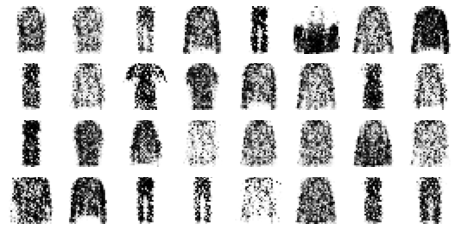

In [61]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)

Epoch 1/50


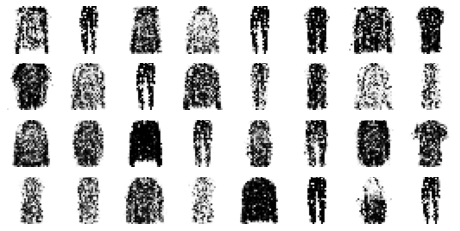

Epoch 2/50


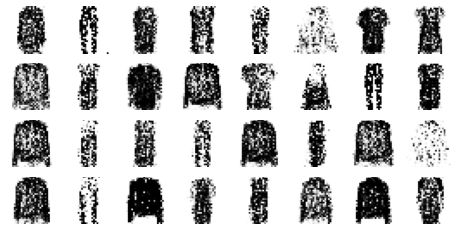

Epoch 3/50


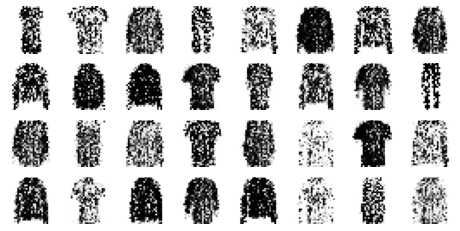

Epoch 4/50


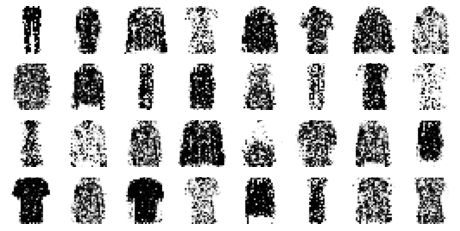

Epoch 5/50


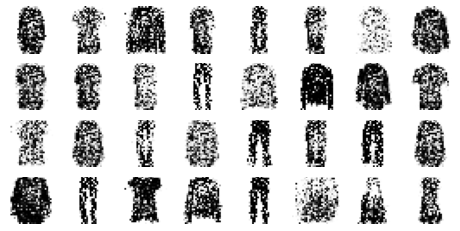

Epoch 6/50


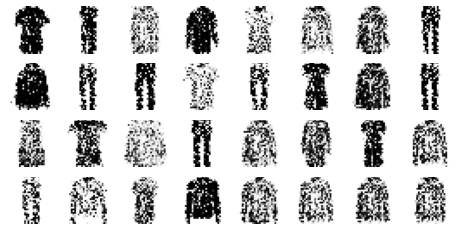

Epoch 7/50


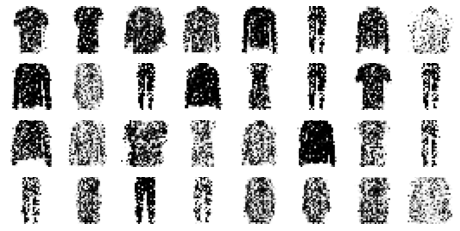

Epoch 8/50


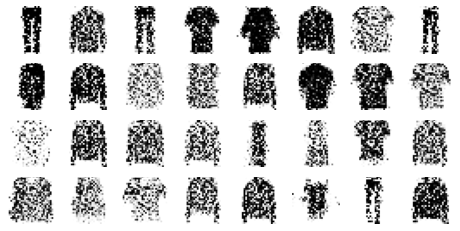

Epoch 9/50


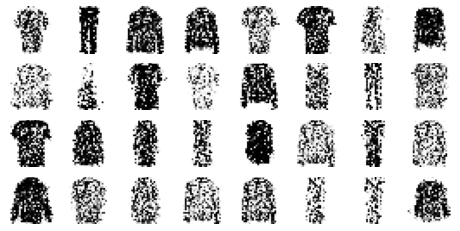

Epoch 10/50


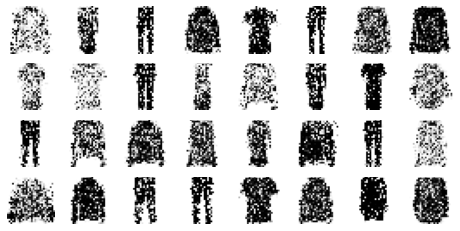

Epoch 11/50


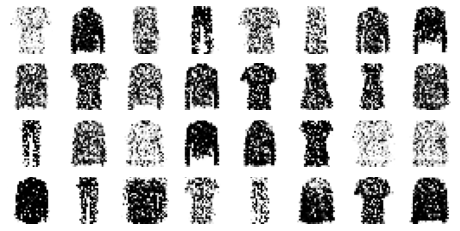

Epoch 12/50


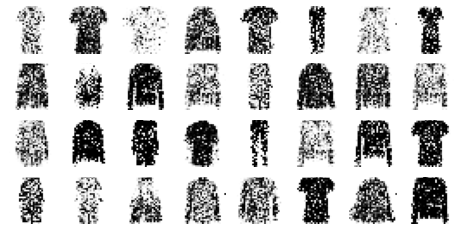

Epoch 13/50


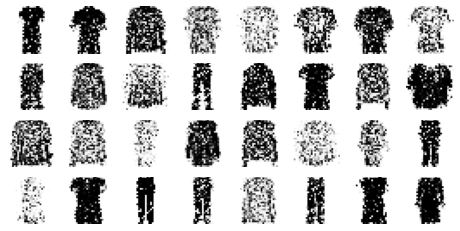

Epoch 14/50


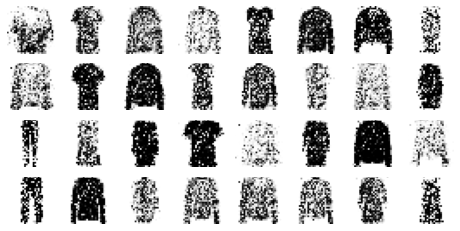

Epoch 15/50


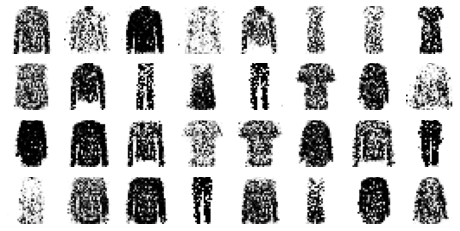

Epoch 16/50


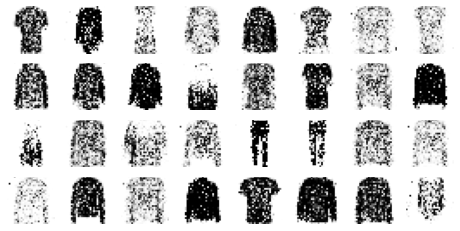

Epoch 17/50


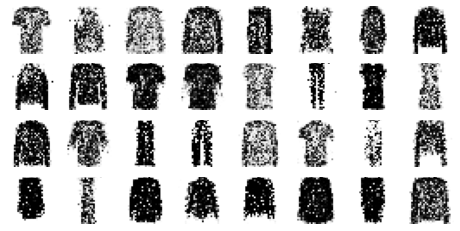

Epoch 18/50


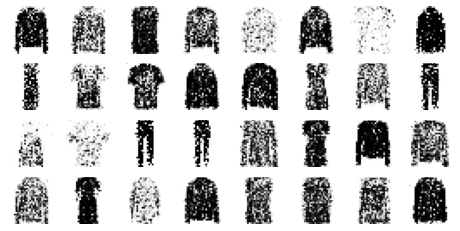

Epoch 19/50


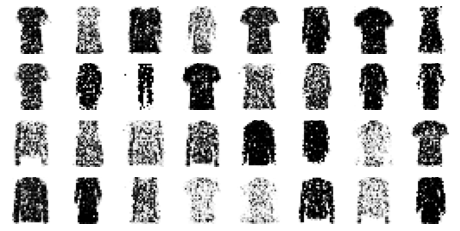

Epoch 20/50


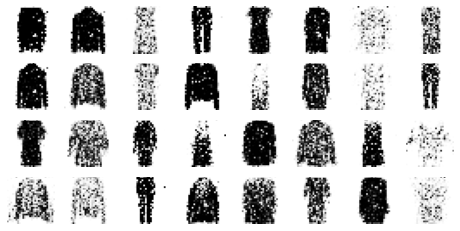

Epoch 21/50


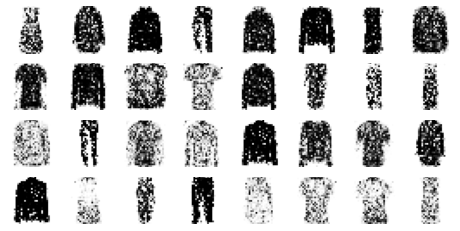

Epoch 22/50


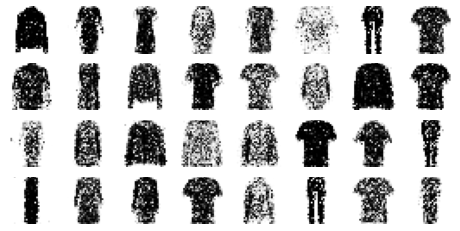

Epoch 23/50


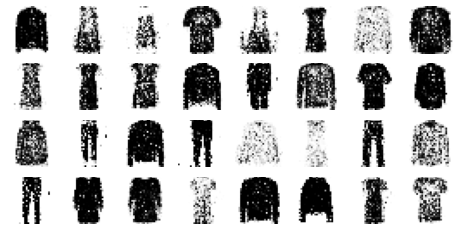

Epoch 24/50


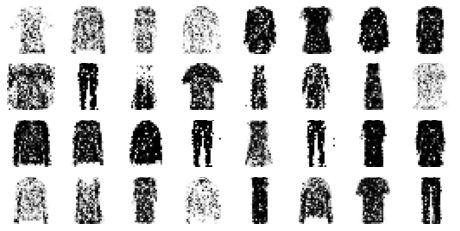

Epoch 25/50


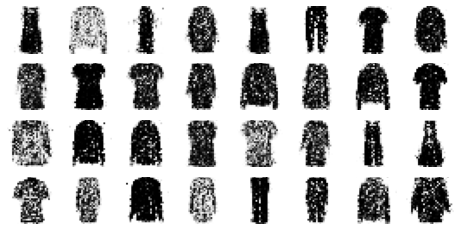

Epoch 26/50


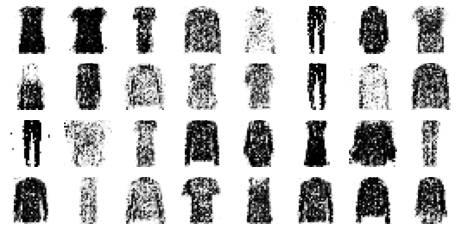

Epoch 27/50


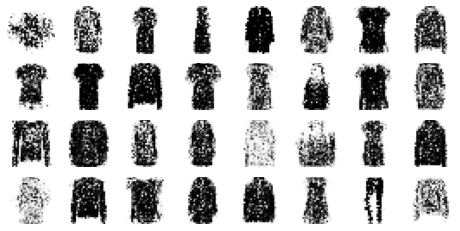

Epoch 28/50


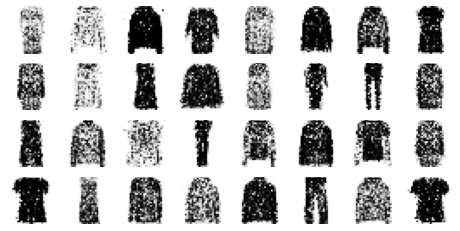

Epoch 29/50


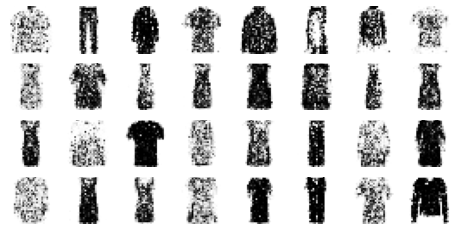

Epoch 30/50


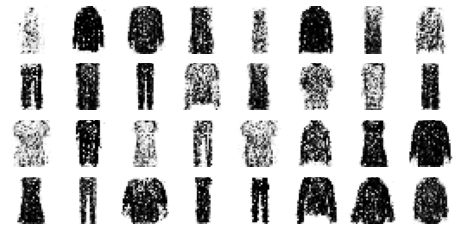

Epoch 31/50


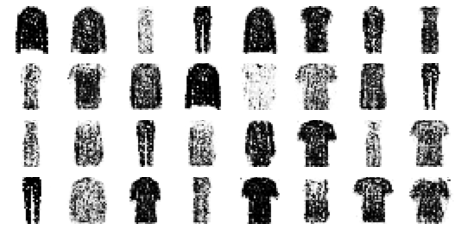

Epoch 32/50


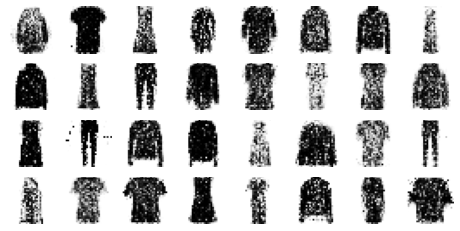

Epoch 33/50


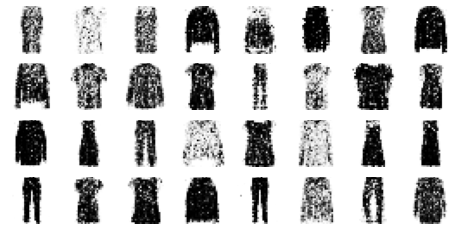

Epoch 34/50


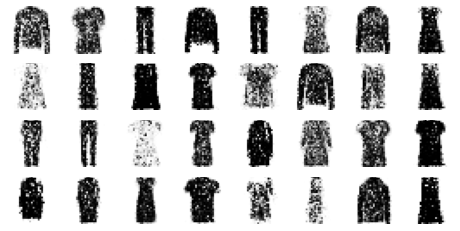

Epoch 35/50


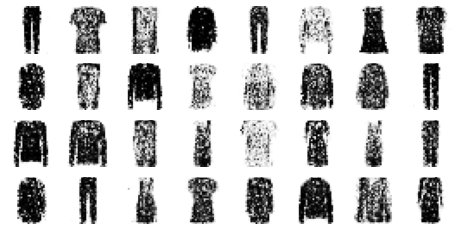

Epoch 36/50


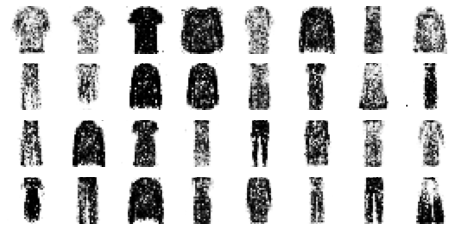

Epoch 37/50


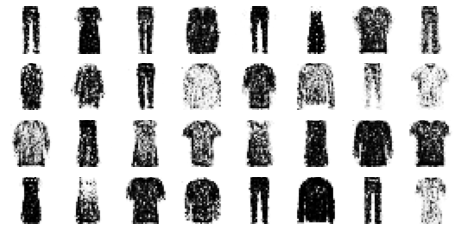

Epoch 38/50


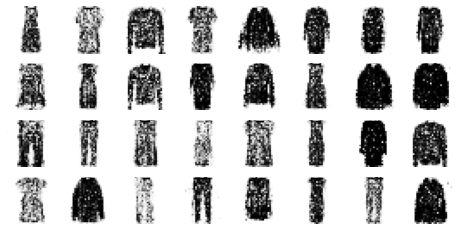

Epoch 39/50


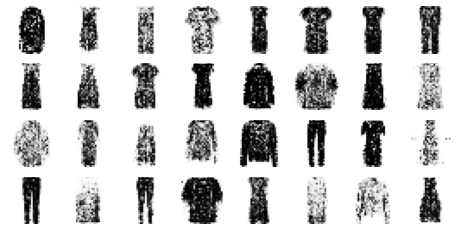

Epoch 40/50


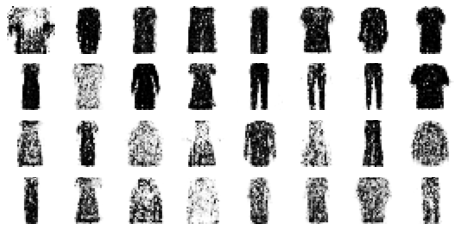

Epoch 41/50


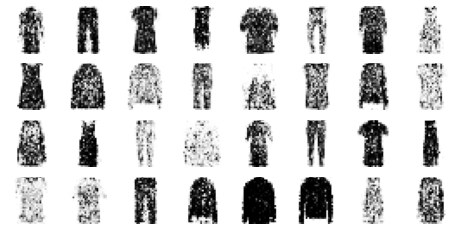

Epoch 42/50


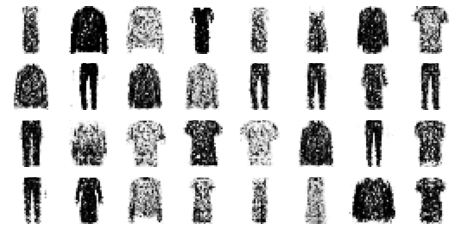

Epoch 43/50


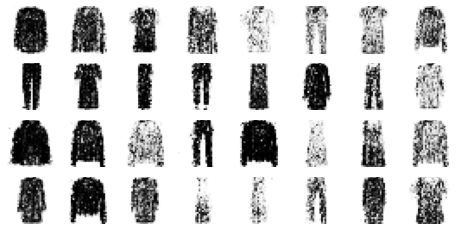

Epoch 44/50


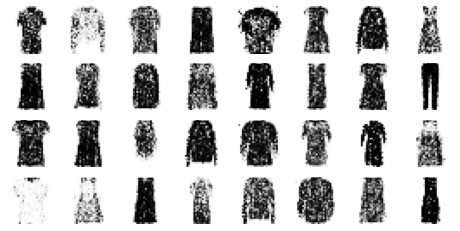

Epoch 45/50


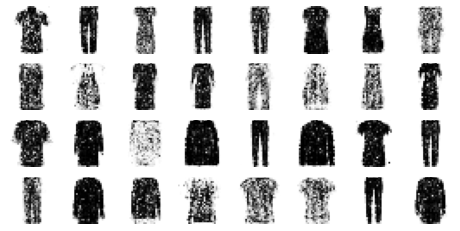

Epoch 46/50


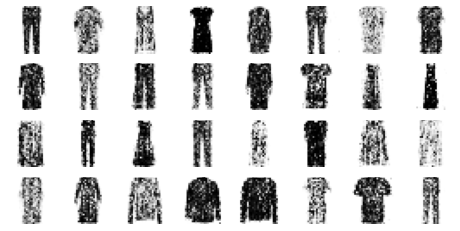

Epoch 47/50


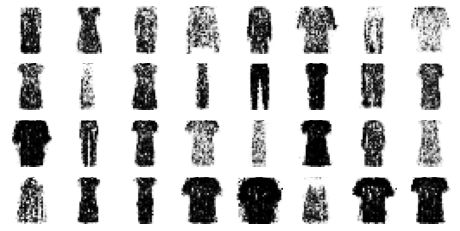

Epoch 48/50


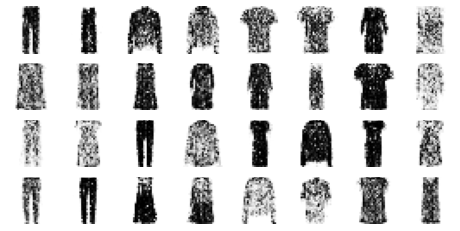

Epoch 49/50


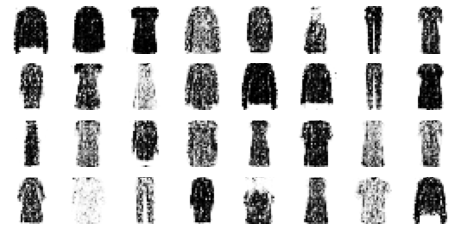

Epoch 50/50


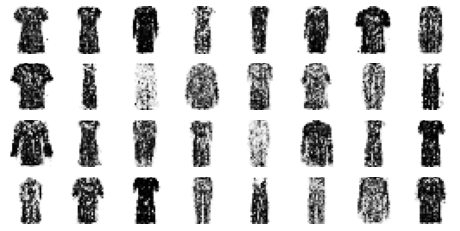

In [62]:
train_gan(gan, dataset, batch_size, codings_size)

- Unfortunately, the images never really get much better than that, and you may even find epochs where the **GAN seems to be forgetting what it learned.** 
- Why is that? Well, it turns out that training a GAN can be challenging. Let’s see why.

### The Difficulties of Training GANs
- During training, the generator and the discriminator constantly try to outsmart each other, in a zero-sum game.
- As training advances, the game may end up in a state that game theorists call a **Nash equilibrium**, named after the mathematician John Nash: this is when no player would be better off changing their own strategy, assuming the other players do not change theirs.
    - For example, a Nash equilibrium is reached when everyone drives on the left side of the road: no driver would be better off being the only one to switch sides.
- Of course, there is a second possible Nash equilibrium: when everyone drives on the right side of the road. Different initial states and dynamics may lead to one equilibrium or the other.
    - In this example, there is a single optimal strategy once an equilibrium is reached (i.e., driving on the same side as everyone else), but a Nash equilibrium can involve multiple competing strategies (e.g., a predator chases its prey, the prey tries to escape, and neither would be better off changing their strategy).

So how does this apply to GANs?
- Well, the authors of the paper demonstrated that **a GAN can only reach a single Nash equilibrium: that’s when the generator produces perfectly realistic images, and the discriminator is forced to guess (50% real, 50% fake).**
- This fact is very encouraging: it would seem that you just need to train the GAN for long enough, and it will eventually reach this equilibrium, giving you a perfect generator. 
    - Unfortunately, it’s not that simple: **nothing guarantees that the equilibrium will ever be reached.**
- The biggest difficulty is called **_mode collapse_**: **this is when the generator’s outputs gradually become less diverse.**
    - How can this happen? Suppose that the generator gets better at producing convincing shoes than any other class.
        - It will fool the discriminator a bit more with shoes, and this will encourage it to produce even more images of shoes. **Gradually, it will forget how to produce anything else.**
        - **Meanwhile, the only fake images that the discriminator will see will be shoes, so it will also forget how to discriminate fake images of other classes.**
    - **Eventually, when the discriminator manages to discriminate the fake shoes from the real ones, the generator will be forced to move to another class.**
    - It may then become good at shirts, forgetting about shoes, and the discriminator will follow. 
    - **The GAN may gradually cycle across a few classes, never really becoming very good at any of them.**
- Moreover, because the generator and the discriminator are constantly pushing against each other, their parameters may end up oscillating and becoming unstable.
    - Training may begin properly, then suddenly diverge for no apparent reason, due to these instabilities.
    - And since many factors affect these complex dynamics, GANs are very sensitive to the hyperparameters: you may have to spend a lot of effort fine-tuning them.
- These problems have kept researchers very busy since 2014: many papers were published on this topic, some proposing new cost functions (though a 2018 paper by Google researchers questions their efficiency) or techniques to stabilize training or to avoid the mode collapse issue.
    - For example, a popular technique called **experience replay** consists in storing the images produced by the generator at each iteration in a replay buffer (gradually dropping older generated images) and training the discriminator using real images plus fake images drawn from this buffer (rather than just fake images produced by the current generator).
        - This reduces the chances that the discriminator will overfit the latest generator’s outputs.
    - Another common technique is called **mini-batch discrimination**: it measures how similar images are across the batch and provides this statistic to the discriminator, so it can easily reject a whole batch of fake images that lack diversity.
        - This encourages the generator to produce a greater variety of images, reducing the chance of mode collapse.
    - Other papers simply propose specific architectures that happen to perform well.
- In short, this is still a very active field of research, and the dynamics of GANs are still not perfectly understood. But the good news is that great progress has been made, and some of the results are truly astounding! 
- So let’s look at some of the most successful architectures, starting with **deep convolutional GANs**, which were the state of the art just a few years ago.
- Then we will look at two more recent (and more complex) architectures.

## Deep Convolutional GANs
- The original GAN paper in 2014 experimented with convolutional layers, but only tried to generate small images.
- Soon after, many researchers tried to build GANs based on deeper convolutional nets for larger images.
- This proved to be tricky, as training was very unstable, but Alec Radford et al. finally succeeded in late 2015, after experimenting with many different architectures and hyperparameters.
- They called their architecture deep convolutional GANs (DCGANs). Here are the main guidelines they proposed for building stable convolutional GANs:
    - Replace any pooling layers with strided convolutions (in the discriminator) and transposed convolutions (in the generator).
    - Use Batch Normalization in both the generator and the discriminator, except in the generator’s output layer and the discriminator’s input layer.
    - Remove fully connected hidden layers for deeper architectures.
    - Use ReLU activation in the generator for all layers except the output layer, which should use tanh.
    - Use leaky ReLU activation in the discriminator for all layers.

- These guidelines will work in many cases, but not always, so you may still need to experiment with different hyperparameters (in fact, just changing the random seed and training the same model again will sometimes work).

For example, here is a small DCGAN that works reasonably well with Fashion MNIST:

In [63]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])

discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])

gan = keras.models.Sequential([generator, discriminator])

In [64]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

- The generator takes codings of size 100, and it projects them to 6272 dimensions (7 * 7 * 128), and reshapes the result to get a 7 × 7 × 128 tensor.
- This tensor is batch normalized and fed to a transposed convolutional layer with a stride of 2, which upsamples it from 7 × 7 to 14 × 14 and reduces its depth from 128 to 64.
- The result is batch normalized again and fed to another transposed convolutional layer with a stride of 2, which upsamples it from 14 × 14 to 28 × 28 and reduces the depth from 64 to 1.
    - **This layer uses the tanh activation function, so the outputs will range from –1 to 1.**
- For this reason, before training the GAN, we need to rescale the training set to that same range. 
    - We also need to reshape it to add the channel dimension:

In [66]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

- The discriminator looks much like a regular CNN for binary classification, except instead of using max pooling layers to downsample the image, we use strided convolutions (strides=2). 
    - Also note that we use the leaky ReLU activation function.
- Overall, we respected the DCGAN guidelines, except we replaced the BatchNormalization layers in the discriminator with Dropout layers (otherwise training was unstable in this case) and we replaced ReLU with SELU in the generator.
    - Feel free to tweak this architecture: you will see how sensitive it is to the hyperparameters (especially the relative learning rates of the two networks).
- Lastly, to build the dataset, then compile and train this model, we use the exact same code as earlier.

In [67]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/50


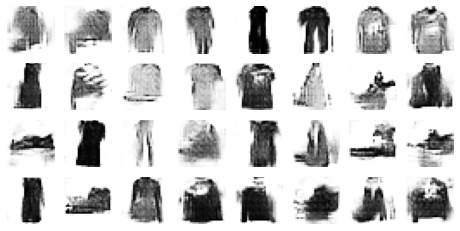

Epoch 2/50


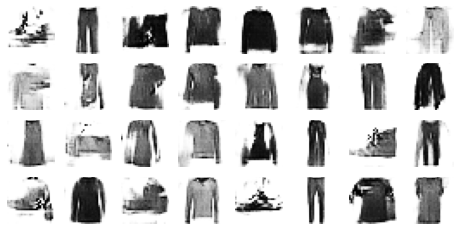

Epoch 3/50


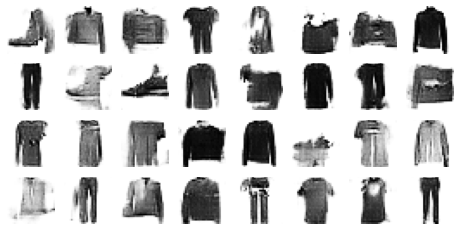

Epoch 4/50


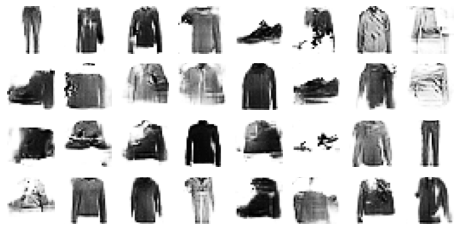

Epoch 5/50


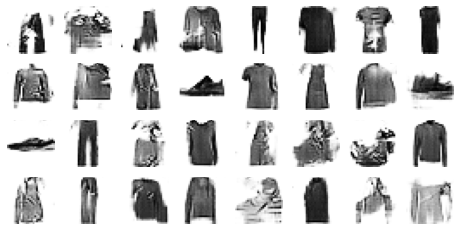

Epoch 6/50


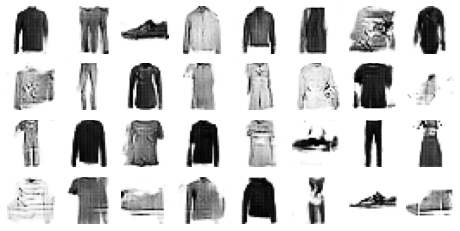

Epoch 7/50


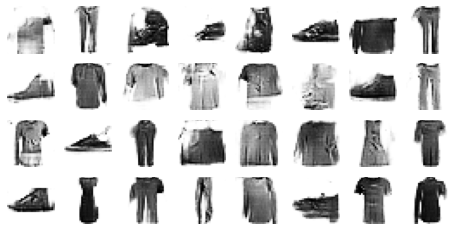

Epoch 8/50


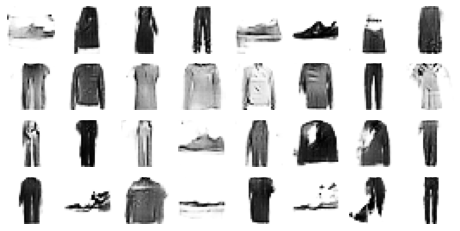

Epoch 9/50


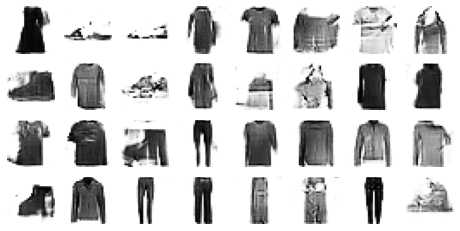

Epoch 10/50


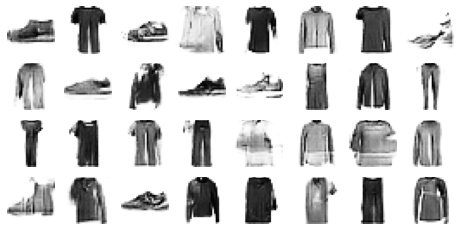

Epoch 11/50


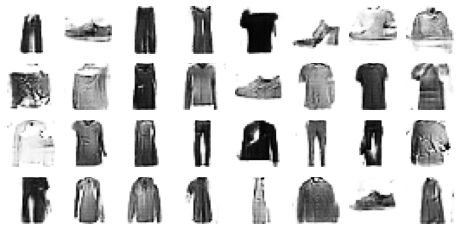

Epoch 12/50


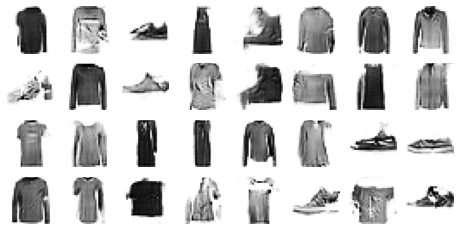

Epoch 13/50


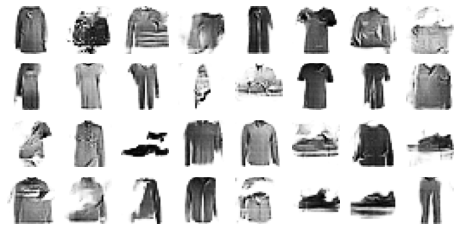

Epoch 14/50


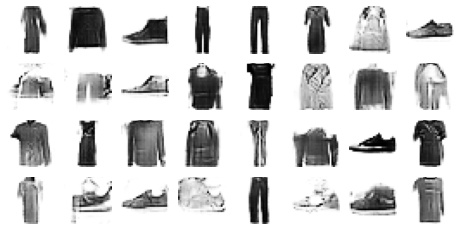

Epoch 15/50


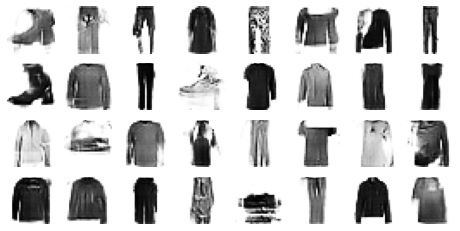

Epoch 16/50


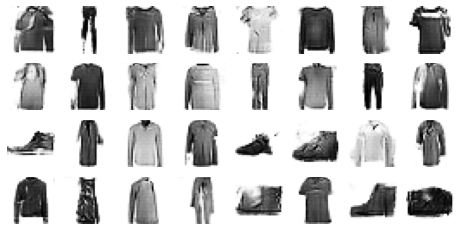

Epoch 17/50


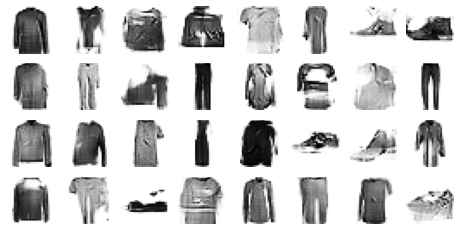

Epoch 18/50


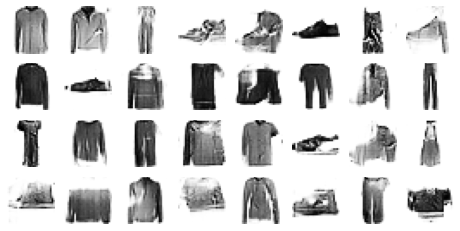

Epoch 19/50


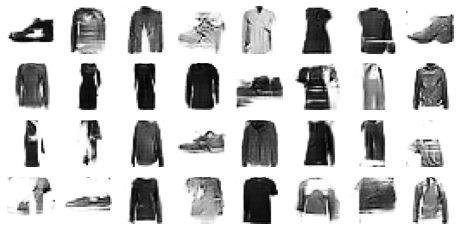

Epoch 20/50


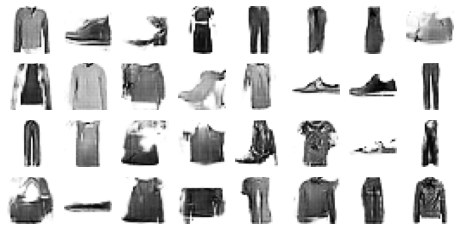

Epoch 21/50


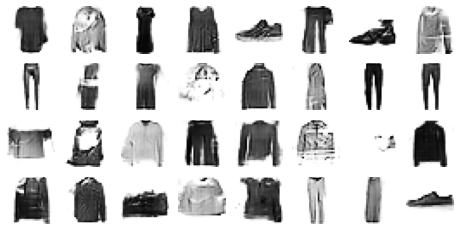

Epoch 22/50


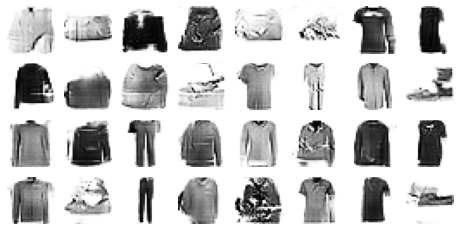

Epoch 23/50


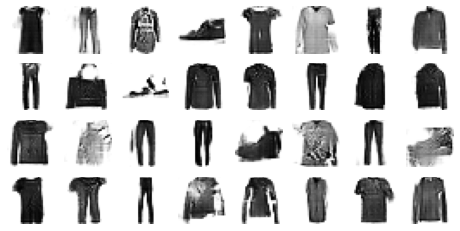

Epoch 24/50


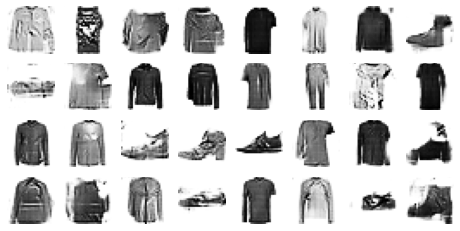

Epoch 25/50


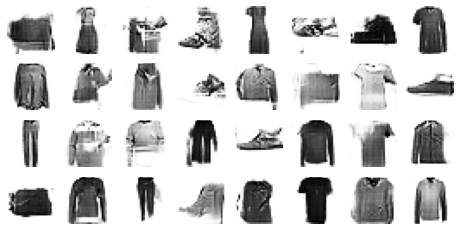

Epoch 26/50


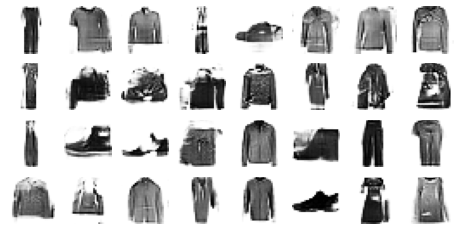

Epoch 27/50


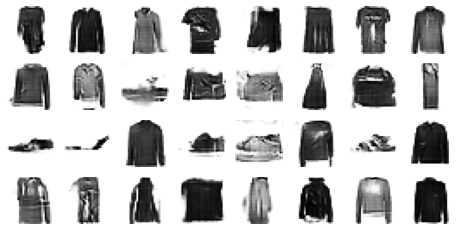

Epoch 28/50


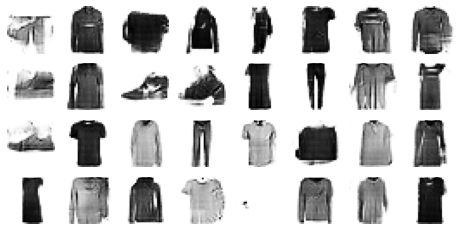

Epoch 29/50


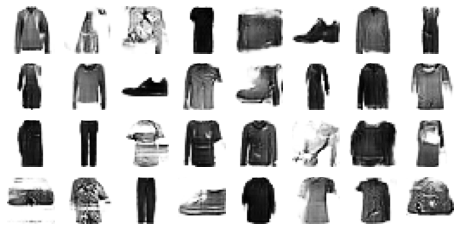

Epoch 30/50


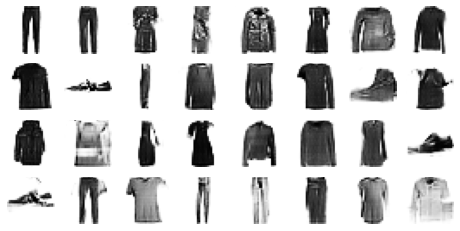

Epoch 31/50


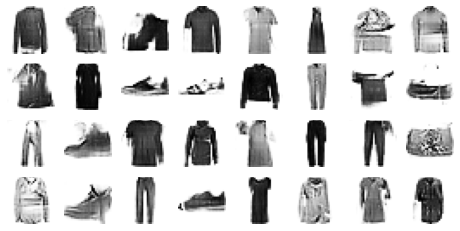

Epoch 32/50


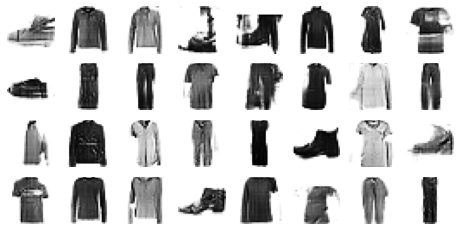

Epoch 33/50


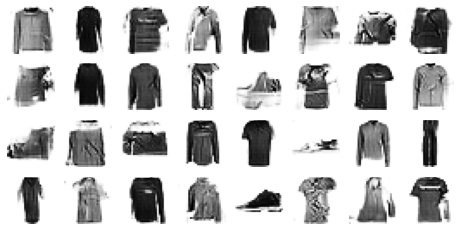

Epoch 34/50


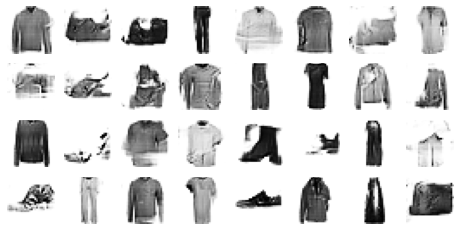

Epoch 35/50


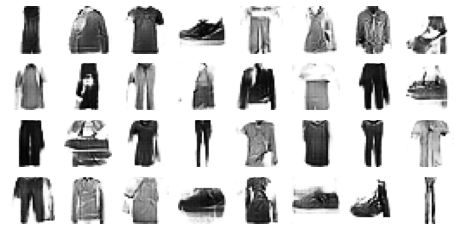

Epoch 36/50


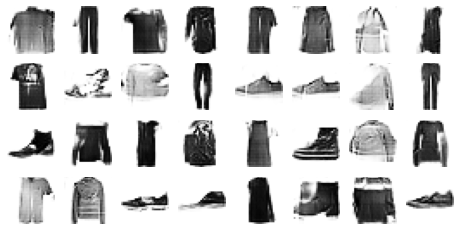

Epoch 37/50


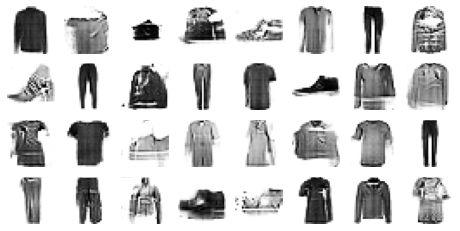

Epoch 38/50


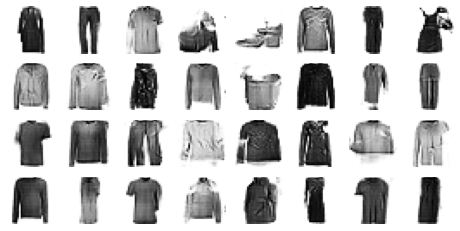

Epoch 39/50


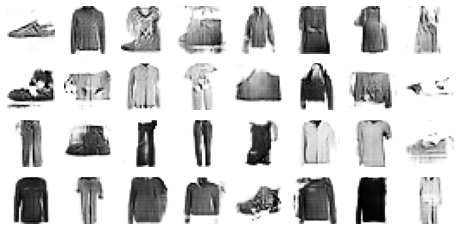

Epoch 40/50


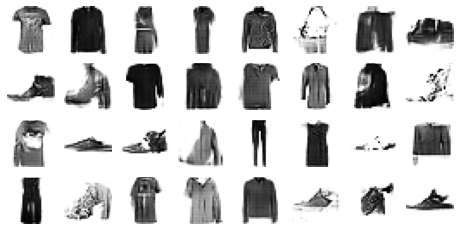

Epoch 41/50


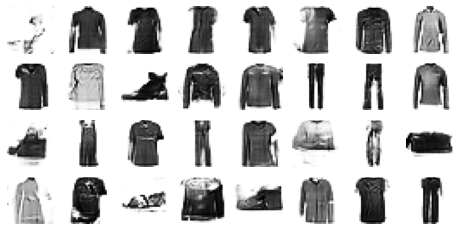

Epoch 42/50


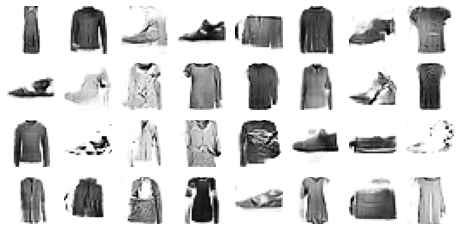

Epoch 43/50


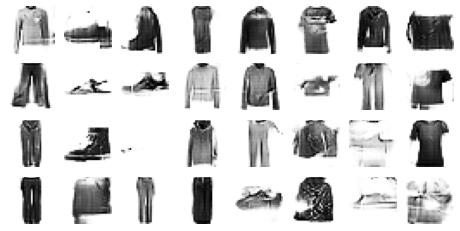

Epoch 44/50


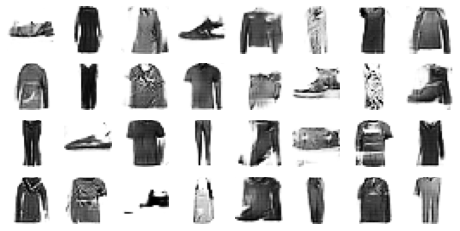

Epoch 45/50


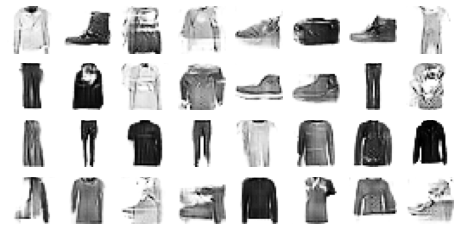

Epoch 46/50


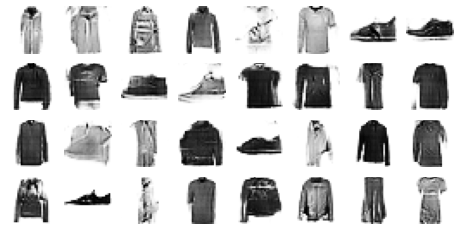

Epoch 47/50


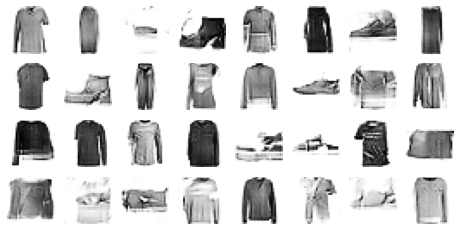

Epoch 48/50


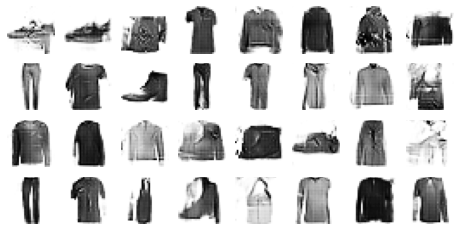

Epoch 49/50


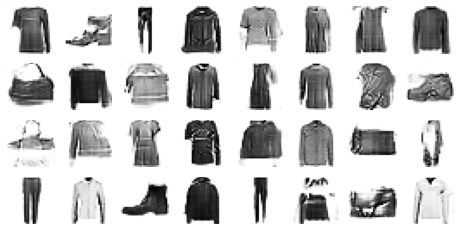

Epoch 50/50


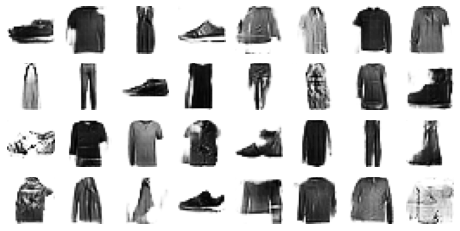

In [68]:
train_gan(gan, dataset, batch_size, codings_size)

It’s still not perfect, but many of these images are pretty convincing.

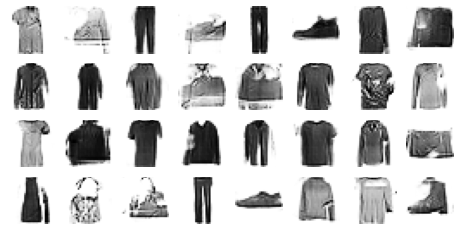

In [69]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)

#### TIP
- If you add each image’s class as an extra input to both the generator and the discriminator, they will both learn what each class looks like, and thus you will be able to control the class of each image produced by the generator. 
    - This is called a conditional GAN (CGAN).

***
- DCGANs aren’t perfect, though. For example, when you try to generate very large images using DCGANs, you often end up with locally convincing features but overall inconsistencies (such as shirts with one sleeve much longer than the other). 

How can you fix this?

## Progressive Growing of GANs
- An important technique was proposed in a 2018 paper by Nvidia researchers Tero Karras et al.: they suggested generating small images at the beginning of training, then gradually adding convolutional layers to both the generator and the discriminator to produce larger and larger images (4 × 4, 8 × 8, 16 × 16, …, 512 × 512, 1,024 × 1,024).
- This approach resembles greedy layer-wise training of stacked autoencoders.
- The extra layers get added at the end of the generator and at the beginning of the discriminator, and previously trained layers remain trainable.

<img src="17-19.png">

Evaluation is one of the big challenges when working with GANs: although it is possible to automatically evaluate the
diversity of the generated images, judging their quality is a much trickier and subjective task.
- One technique is to use human raters, but this is costly and time-consuming.
- So the authors proposed to measure the similarity between the local image structure of the generated images and the training images, considering every scale. 
    - This idea led them to another groundbreaking innovation: **StyleGANs.**

## StyleGANs
- The state of the art in high-resolution image generation was advanced once again by the same Nvidia team in a 2018 paper that introduced the popular StyleGAN architecture. 
- The authors used style transfer techniques in the generator to ensure that the generated images have the same local structure as the training images, at every scale, greatly improving the quality of the generated images.
- The discriminator and the loss function were not modified, only the generator.
    - Let’s take a look at the StyleGAN. It is composed of two networks (see Figure 17-20):

#### Mapping network
- An eight-layer MLP that maps the latent representations z (i.e., the codings) to a vector w. 
- This vector is then sent through multiple affine transformations (i.e., Dense layers with no activation functions, represented by the “A” boxes in Figure 17-20), which produces multiple vectors.
- These vectors control the style of the generated image at different levels, from fine-grained texture (e.g., hair color) to high-level features (e.g., adult or child).
- In short, the mapping network maps the codings to multiple style vectors.

#### Synthesis network
- Responsible for generating the images.
- It has a constant learned input (to be clear, this input will be constant after training, but during training it keeps getting tweaked by backpropagation).
- It processes this input through multiple convolutional and upsampling layers, as earlier, but there are two twists:
    - First, some noise is added to the input and to all the outputs of the convolutional layers (before the activation function).
    - Second, each noise layer is followed by an Adaptive Instance Normalization (AdaIN) layer: it standardizes each feature map independently (by subtracting the feature map’s mean and dividing by its standard deviation), then it uses the style vector to determine the scale and offset of each feature map (the style vector contains one scale and one bias term for each feature map).

<img src="17-20.png">

- The idea of adding noise independently from the codings is very important.
    - Some parts of an image are quite random, such as the exact position of each freckle or hair.
- In earlier GANs, this randomness had to either come from the codings or be some pseudorandom noise produced by the generator itself.
    - If it came from the codings, it meant that the generator had to dedicate a significant portion of the codings’ representational power to store noise: this is quite wasteful.
    - Moreover, the noise had to be able to flow through the network and reach the final layers of the generator: this seems like an unnecessary constraint that probably slowed down training.
    - And finally, some visual artifacts may appear because the same noise was used at different levels.
- If instead the generator tried to produce its own pseudorandom noise, this noise might not look very convincing, leading to more visual artifacts. 
    - Plus, part of the generator’s weights would be dedicated to generating pseudorandom noise, which again seems wasteful.
- **By adding extra noise inputs, all these issues are avoided**; the GAN is able to use the provided noise to add the right amount of stochasticity to each part of the image.
- The added noise is different for each level. Each noise input consists of a single feature map full of Gaussian noise, which is broadcast to all feature maps (of the given level) and scaled using learned per-feature scaling factors (this is represented by the “B” boxes in Figure 17-20) before it is added.
- Finally, StyleGAN uses a technique called **mixing regularization** (or **style mixing**), where a percentage of the generated images are produced using two different codings.
    - Specifically, the codings c1 and c2 are sent through the mapping network, giving two style vectors w1 and w2.
    - Then the synthesis network generates an image based on the styles w1 for the first levels and the styles w2 for the remaining levels.
    - The cutoff level is picked randomly.
        - This prevents the network from assuming that styles at adjacent levels are correlated, which in turn encourages locality in the GAN, meaning that each style vector only affects a limited number of traits in the generated image.

## Exercises
### Unsupervised pretraining
Let's create a small neural network for MNIST classification:

Build a **Deep Denoising Autoencoder**

In [70]:
tf.random.set_seed(42)
np.random.seed(42)

X_train_small = X_train[:500]
y_train_small = y_train[:500]

classifier = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Flatten(),
    keras.layers.Dense(20, activation="selu"),
    keras.layers.Dense(10, activation="softmax")
])

classifier.compile(loss="sparse_categorical_crossentropy", optimizer=keras.optimizers.SGD(lr=0.02),
                   metrics=["accuracy"])

history = classifier.fit(X_train_small, y_train_small, epochs=20,
                         validation_data=(X_valid, y_valid))

Epoch 1/20
16/16 [==============================] - 12s 203ms/step - loss: 2.2651 - accuracy: 0.2093 - val_loss: 1.9777 - val_accuracy: 0.4180
Epoch 2/20
16/16 [==============================] - 2s 121ms/step - loss: 1.8718 - accuracy: 0.4917 - val_loss: 1.6231 - val_accuracy: 0.5412
Epoch 3/20
16/16 [==============================] - 2s 121ms/step - loss: 1.4706 - accuracy: 0.5758 - val_loss: 1.2621 - val_accuracy: 0.6000
Epoch 4/20
16/16 [==============================] - 2s 117ms/step - loss: 1.1272 - accuracy: 0.6754 - val_loss: 1.0045 - val_accuracy: 0.6892
Epoch 5/20
16/16 [==============================] - 2s 117ms/step - loss: 1.0439 - accuracy: 0.6380 - val_loss: 0.9216 - val_accuracy: 0.6944
Epoch 6/20
16/16 [==============================] - 2s 125ms/step - loss: 0.9573 - accuracy: 0.6512 - val_loss: 0.8652 - val_accuracy: 0.6980
Epoch 7/20
16/16 [==============================] - 2s 121ms/step - loss: 0.7996 - accuracy: 0.7358 - val_loss: 0.8066 - val_accuracy: 0.7024
Epoch

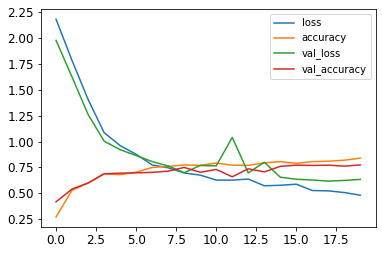

In [72]:
import pandas as pd
pd.DataFrame(history.history).plot()
plt.show()

Build a **Classification DNN**, reusing the lower layers of the autoencoder.

In [73]:
tf.random.set_seed(42)
np.random.seed(42)

conv_encoder_clone = keras.models.clone_model(conv_encoder)

pretrained_clf = keras.models.Sequential([
    conv_encoder_clone,
    keras.layers.Flatten(),
    keras.layers.Dense(20, activation="selu"),
    keras.layers.Dense(10, activation="softmax")
])

In [74]:
conv_encoder_clone.trainable = False
pretrained_clf.compile(loss="sparse_categorical_crossentropy",
                       optimizer=keras.optimizers.SGD(lr=0.02),
                       metrics=["accuracy"])

history = pretrained_clf.fit(X_train_small, y_train_small, epochs=30,
                             validation_data=(X_valid, y_valid))

Epoch 1/30
16/16 [==============================] - 3s 165ms/step - loss: 2.3378 - accuracy: 0.1521 - val_loss: 2.2306 - val_accuracy: 0.2382
Epoch 2/30
16/16 [==============================] - 2s 108ms/step - loss: 2.2126 - accuracy: 0.2548 - val_loss: 2.1302 - val_accuracy: 0.3560
Epoch 3/30
16/16 [==============================] - 2s 106ms/step - loss: 2.1059 - accuracy: 0.3816 - val_loss: 2.0362 - val_accuracy: 0.4132
Epoch 4/30
16/16 [==============================] - 2s 104ms/step - loss: 2.0001 - accuracy: 0.4831 - val_loss: 1.9561 - val_accuracy: 0.5152
Epoch 5/30
16/16 [==============================] - 2s 109ms/step - loss: 1.9365 - accuracy: 0.5318 - val_loss: 1.8746 - val_accuracy: 0.5920
Epoch 6/30
16/16 [==============================] - 2s 104ms/step - loss: 1.8599 - accuracy: 0.5879 - val_loss: 1.7987 - val_accuracy: 0.6340
Epoch 7/30
16/16 [==============================] - 2s 104ms/step - loss: 1.7754 - accuracy: 0.6632 - val_loss: 1.7221 - val_accuracy: 0.6414
Epoch 

In [75]:
conv_encoder_clone.trainable = True
pretrained_clf.compile(loss="sparse_categorical_crossentropy",
                       optimizer=keras.optimizers.SGD(lr=0.02),
                       metrics=["accuracy"])

history = pretrained_clf.fit(X_train_small, y_train_small, epochs=20,
                             validation_data=(X_valid, y_valid))

Epoch 1/20
16/16 [==============================] - 4s 156ms/step - loss: 0.8677 - accuracy: 0.7529 - val_loss: 0.7980 - val_accuracy: 0.7214
Epoch 2/20
16/16 [==============================] - 2s 125ms/step - loss: 0.7504 - accuracy: 0.7582 - val_loss: 0.7892 - val_accuracy: 0.7208
Epoch 3/20
16/16 [==============================] - 2s 123ms/step - loss: 0.6853 - accuracy: 0.7764 - val_loss: 0.7745 - val_accuracy: 0.7076
Epoch 4/20
16/16 [==============================] - 2s 123ms/step - loss: 0.6895 - accuracy: 0.7601 - val_loss: 0.7189 - val_accuracy: 0.7310
Epoch 5/20
16/16 [==============================] - 2s 121ms/step - loss: 0.7265 - accuracy: 0.7445 - val_loss: 0.6886 - val_accuracy: 0.7424
Epoch 6/20
16/16 [==============================] - 2s 151ms/step - loss: 0.6901 - accuracy: 0.7327 - val_loss: 0.7121 - val_accuracy: 0.7284
Epoch 7/20
16/16 [==============================] - 2s 120ms/step - loss: 0.6016 - accuracy: 0.7977 - val_loss: 0.6895 - val_accuracy: 0.7354
Epoch 

### Hashing Using a Binary Autoencoder

In [76]:
tf.random.set_seed(42)
np.random.seed(42)

hashing_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.GaussianNoise(15.),
    keras.layers.Dense(16, activation="sigmoid"),
])

hashing_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[16]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

hashing_ae = keras.models.Sequential([hashing_encoder, hashing_decoder])
hashing_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.0),
                   metrics=[rounded_accuracy])

history = hashing_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 13s 6ms/step - loss: 0.5250 - rounded_accuracy: 0.7116 - val_loss: 0.4856 - val_rounded_accuracy: 0.7350
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.4838 - rounded_accuracy: 0.7377 - val_loss: 0.4691 - val_rounded_accuracy: 0.7654
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.4364 - rounded_accuracy: 0.7914 - val_loss: 0.4215 - val_rounded_accuracy: 0.8057
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.4109 - rounded_accuracy: 0.8137 - val_loss: 0.4120 - val_rounded_accuracy: 0.8105
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.4024 - rounded_accuracy: 0.8203 - val_loss: 0.4106 - val_rounded_accuracy: 0.8111
Epoch 6/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3991 - rounded_accuracy: 0.8230 - val_loss: 0.4081 - val_rounded_accuracy: 0.8147
Epoch 7/10
1719/1719 [================

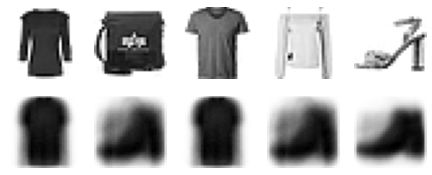

In [77]:
show_reconstructions(hashing_ae)
plt.show()

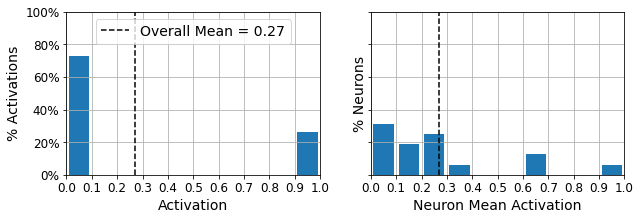

In [78]:
plot_activations_histogram(hashing_encoder)
plt.show()

In [79]:
hashes = np.round(hashing_encoder.predict(X_valid)).astype(np.int32)
hashes *= np.array([[2**bit for bit in range(16)]])
hashes = hashes.sum(axis=1)
for h in hashes[:5]:
    print("{:016b}".format(h))
print("...")

0101000000001001
0000000000000001
0101000000001001
0000000000000001
0000000001000001
...


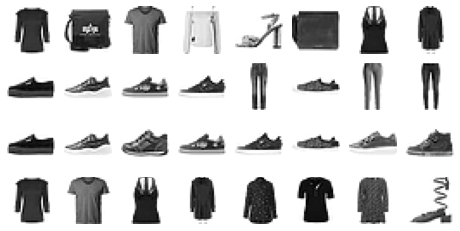

In [80]:
n_bits = 4
n_images = 8
plt.figure(figsize=(n_images, n_bits))
for bit_index in range(n_bits):
    in_bucket = (hashes & 2**bit_index != 0)
    for index, image in zip(range(n_images), X_valid[in_bucket]):
        plt.subplot(n_bits, n_images, bit_index * n_images + index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")